# Example notebook for using RS and Bluestein propagation from propagate module 

In the following we exemplify Rayleigh-Sommerfeld (RS), Bluestein and Scalable Angular Spectrum Method (SASM) propagation available via the ``generate`` module illuminated with plane waves, using the ``propagate`` module. In particular:

* Several examples of RS propagations in Z axis, YZ and XY planes:

    * RS and Bluestein propagation from elements defined from library functions apertures (e.g. Fresnel lenses)
    
    * RS and Bluestein propagation from elements defined from arbitrarily defined functions (e.g. Spiral Phase Plate)
    
    * Some examples comprise comparison of propagations from RS, Bluestein and SASM 
 

In the ``propagate`` module, Rayleigh-Sommerfeld propagation is implemented via direct numerical integration of a double integral (see, e.g. Goodman Fourier Optics textbook as reference), making it (very) time-consuming, yet exact. The Bluestein method was implemented as https://www.nature.com/articles/s41377-020-00362-z - for this method, validity ranges are same as Fresnel propagation, hence please use with caution. The SASM is implemented following https://opg.optica.org/optica/fulltext.cfm?uri=optica-10-11-1407. 

Fresnel and Fraunhofer propagations provide acceptable approximations with faster computation for the propagation in some ranges. In the ``propagate`` module these approximations have been implemented following the Goodman Fourier Optics textbook. For simple use examples of Fresnel and Fraunhofer propagations check propopt package https://github.com/cunhaJ/propopt .
    

In [1]:
# Notebook display options, change as your preference/system
%matplotlib inline
%config InlineBackend.print_figure_kwargs={'facecolor' : "w",'bbox_inches':None}

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 120

In [2]:
import sys
sys.path.insert(0,'..')
sys.path.insert(0,'../..')

from matplotlib import pyplot as plt 
import numpy as np 

from scipy.constants import micro, nano, milli

import pyMOE as moe 
from pyMOE.generate import *  
from pyMOE.propagate import * 

## Propagation from a circular aperture

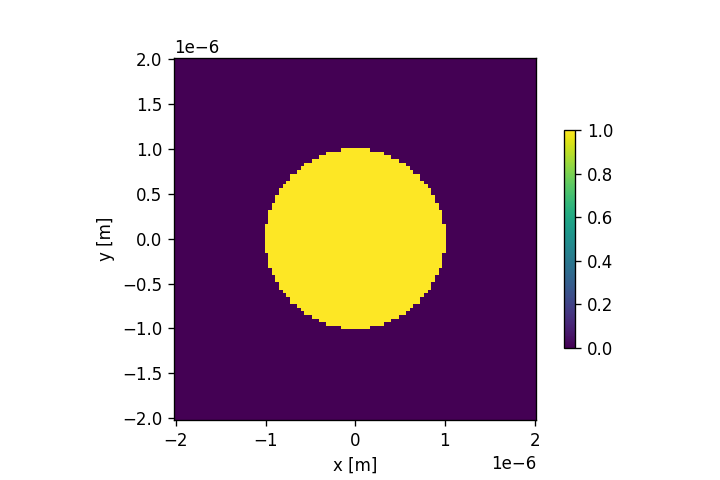

In [3]:
# Make circular apertures (returns also the 2D array)

wavelength = 400e-9 #m
zdist = 100*wavelength #m
 
pixsize = 0.1 * wavelength
x_pixel = 100
y_pixel = 100
 
aperture_width  = x_pixel*pixsize
aperture_height = y_pixel*pixsize

radius = 1000e-9 #m 

# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture from phase mask 
mask = moe.generate.circular_aperture(aperture, radius=radius)

# Define Phase mask 
mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_phase.aperture = mask.aperture*np.pi


# Plot the circular mask
moe.plotting.plot_aperture(mask)


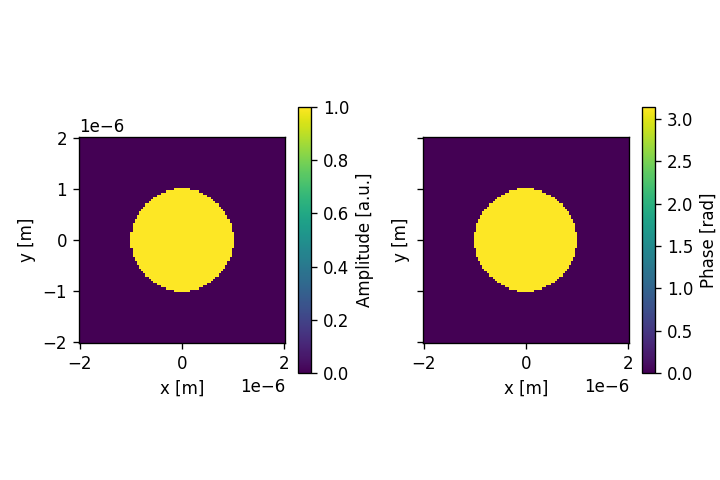

In [4]:
# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(mask)

# Generate a uniform field
field = moe.field.generate_uniform_field(field, E0=1)

# Or Gaussian field is also available 
#field = moe.field.generate_gaussian_field(field, E0=1, w0=100*micro)

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


In [5]:
####Propagate field and calculate in plane YZ, using npix bins in Y
#Using RS propagation, the most exact 
zmin = wavelength
zmax = 0.2*zdist
nzs = 200

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
screen_YZ = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, y_pixel, 
                                        zmin, zmax, nzs,
                                        x=0)

# Propagate the field 
E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, simp2d=True)

[########################################] | 100% Completed | 51.2s


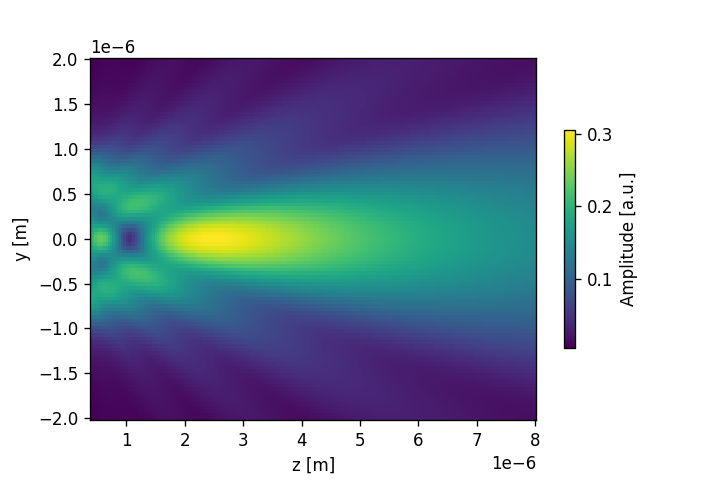

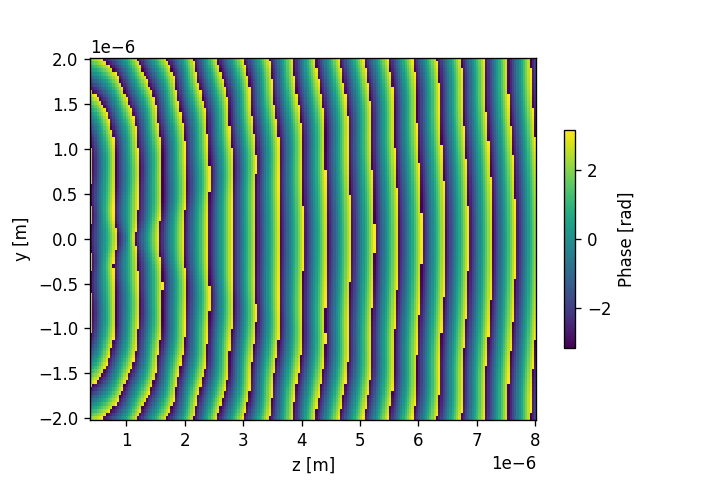

In [6]:
#Plot the amplitude of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='amplitude')
plt.show()

#Plot the phase of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='phase')
plt.show()

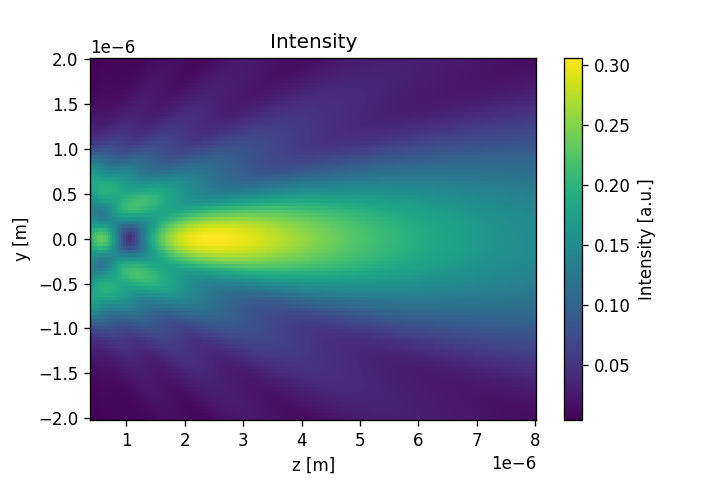

In [7]:
###Plot intensity in the YZ screen
I_YZ= E_YZ 
#I_YZ.screen= np.abs(E_YZ.amplitude)**2 ## careful with multiple assertions this way

moe.plotting.plot_screen_YZ(I_YZ, which='amplitude', colorbar=False)
plt.colorbar(label='Intensity [a.u.]')
plt.title("Intensity")
plt.show()

Elapsed: 0:00:01.779649


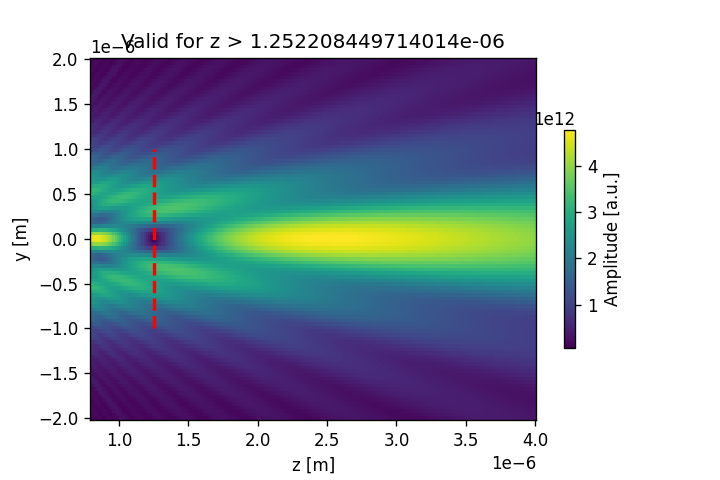

C:\Users\jcunha377\AppData\Local\Programs\Python\Python37\lib\site-packages\numpy\ma\core.py:3379: ComplexWarning: Casting complex values to real discards the imaginary part
  _data[indx] = dval


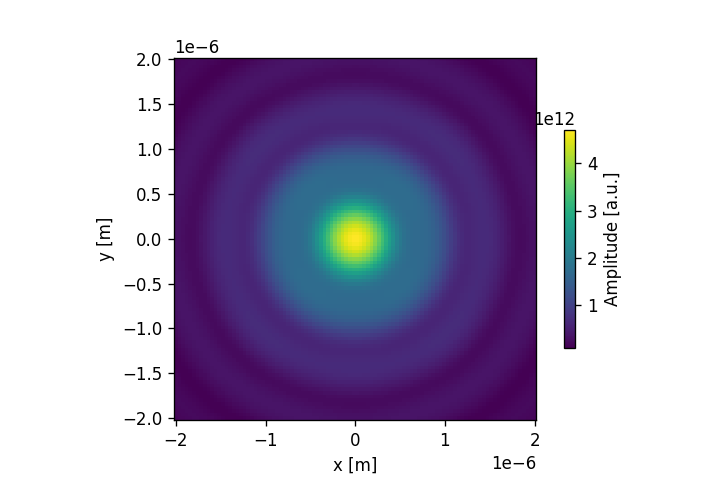

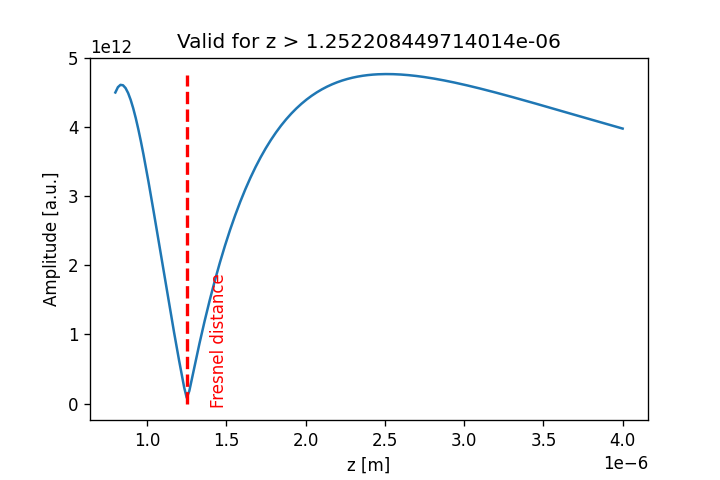

In [8]:
###Propagate field  using Bluestein

zmin = wavelength*2
zmax = 0.1*zdist
nzs = 200

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2, aperture_height/2
xmin, xmax = -aperture_height/2, aperture_height/2

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)

screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Eyz = moe.field.Screen(0,y,z)
Eyz.screen = np.reshape(EXYZ.screen[:,int(y_pixel/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, -radius, radius, colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Exy = moe.field.Screen(x,y,2.5e-6)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(2.5e-6/zmax*nzs)], np.shape(Exy.screen[:, :, :]))


moe.plotting.plot_screen_XY(Exy, which='amplitude')

Ezz = moe.field.Screen(0,0,z)
Ezz.screen = np.reshape(EXYZ.screen[int(x_pixel/2),int(y_pixel/2),:], np.shape(Ezz.screen[:, :, :]))

moe.plotting.plot_screen_ZZ(Ezz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, 0, np.max(Ezz.screen), colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))
plt.annotate("Fresnel distance", (1.4e-6,0.5e-6), rotation="vertical", color="Red")
plt.show()

In [9]:
# Propagates the field in a single line along the Z axis
screen_ZZ = moe.field.create_screen_ZZ(zmin, zmax, nzs)
screen_ZZ = moe.propagate.RS_integral(field, screen_ZZ, wavelength, parallel_computing=True)

#moe.plotting.plot_screen_ZZ(screen_ZZ, which='amplitude')

[########################################] | 100% Completed |  0.8s


Text(1.4e-06, 5e-07, 'Fresnel distance')

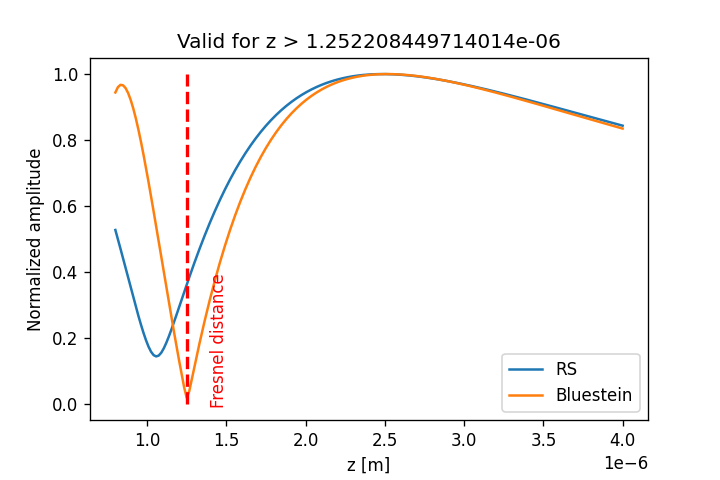

In [10]:
#Compare both propagations 

fig = plt.figure() 

plt.plot(z, np.reshape(np.abs(screen_ZZ.screen)/(np.max(np.abs(screen_ZZ.screen))), np.shape(z)), label="RS")
plt.plot(z, np.reshape(np.abs(Ezz.screen)/(np.max(np.abs(Ezz.screen))), np.shape(z)), label ="Bluestein")

plt.xlabel("z [m]")
plt.ylabel("Normalized amplitude")

plt.vlines(limitx, 0, 1, colors='red', linestyles='dashed', lw=2)
plt.legend()
#plt.annotate("Fresnel distance", (1.4e-6,0.5e-6), rotation="vertical", color="Red")
plt.title("Valid for z > "+str(limitx))
plt.annotate("Fresnel distance", (1.4e-6,0.5e-6), rotation="vertical", color="Red")

Text(1.4e-06, 5e-07, 'Fresnel distance')

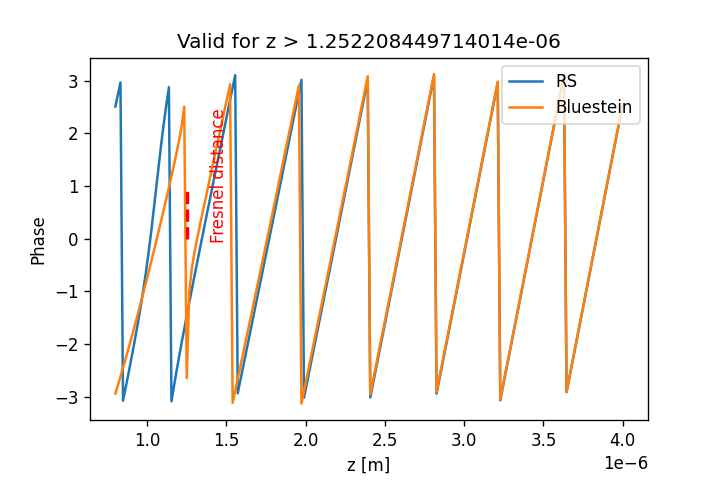

In [11]:
fig = plt.figure() 

plt.plot(z, np.reshape(np.angle(screen_ZZ.screen), np.shape(z)), label="RS")
plt.plot(z, np.reshape(np.angle(Ezz.screen), np.shape(z)), label ="Bluestein")

plt.xlabel("z [m]")
plt.ylabel("Phase")

plt.vlines(limitx, 0, 1, colors='red', linestyles='dashed', lw=2)
plt.legend()
#plt.annotate("Fresnel distance", (1.4e-6,0.5e-6), rotation="vertical", color="Red")
plt.title("Valid for z > "+str(limitx))
plt.annotate("Fresnel distance", (1.4e-6,0.5e-6), rotation="vertical", color="Red")

## Propagation from a Fresnel multilevel mask example #1

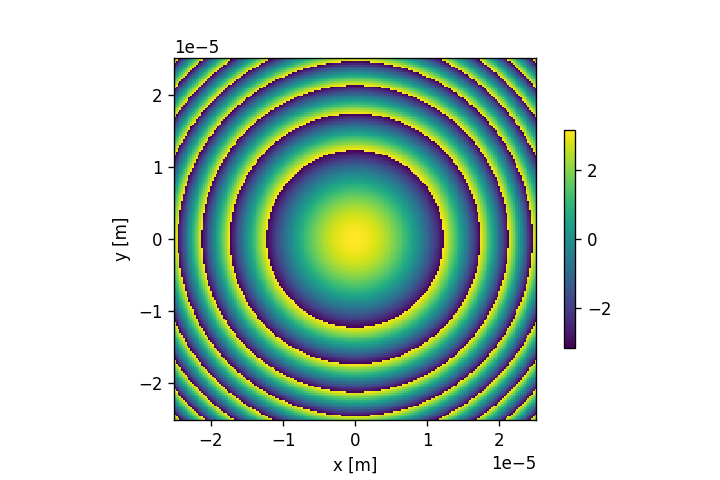

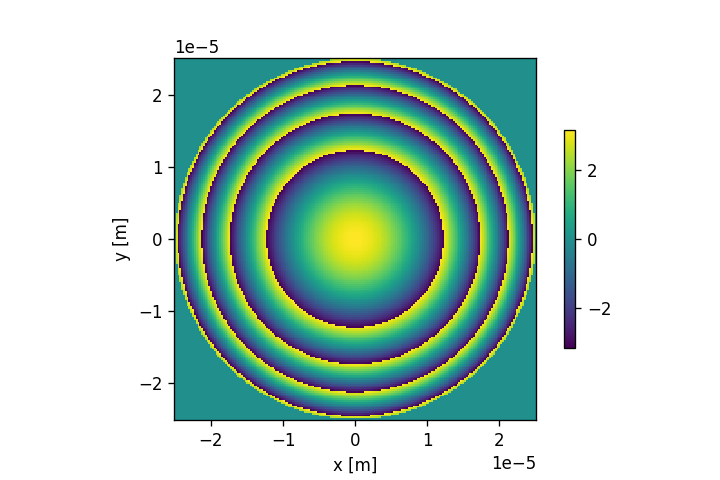

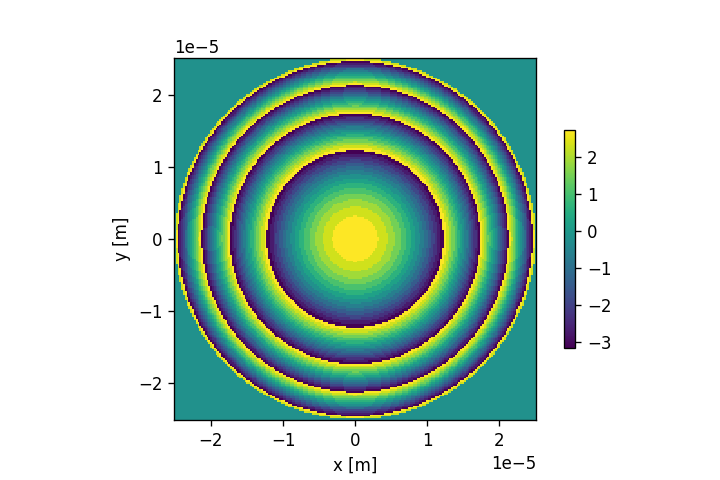

In [12]:
#number of pixels 
x_pixel = 200
y_pixel = 200

#size of the rectangular mask 
aperture_width  = 50e-6 #m
aperture_height = 50e-6

pixsize = 1e-6 #m

wavelength = 500e-9 #m
focal_length = 150e-6

zmin = wavelength
zmax = 1.2* focal_length
nzs = 500

radius = aperture_width/2 

# Create Aperture
aperture1 = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture with Fresnel mask 
mask1 = moe.generate.fresnel_phase(aperture1, focal_length, wavelength )

moe.plotting.plot_aperture(mask1)


##############
###Fresnel mask with a truncated circular aperture 

# Create empty mask
aperture2 = moe.generate.create_empty_aperture_from_aperture(aperture1)

# and truncate around radius
mask2 = moe.generate.fresnel_phase(aperture2, focal_length, wavelength, radius=radius)
moe.plotting.plot_aperture(mask2)

# Discretize mask in number of levels
# Select exact position of contours  in phase
phase_vals = np.linspace(-np.pi, np.pi, 16)

mask2.discretize(np.array( phase_vals)[:] ) 
moe.plotting.plot_aperture(mask2)

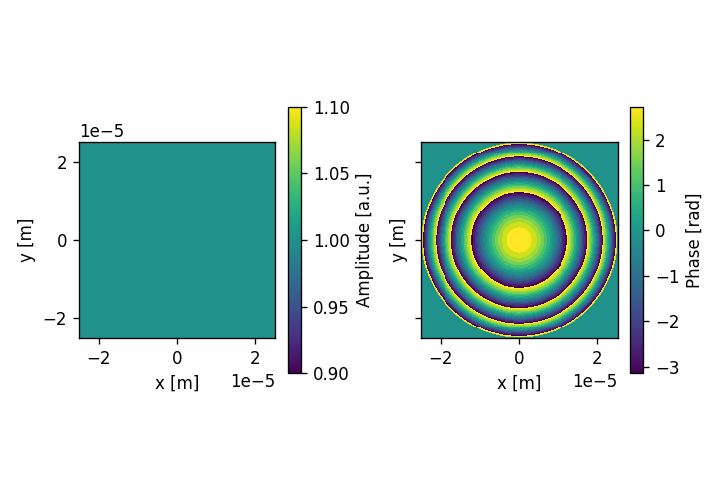

In [13]:
# Generate a uniform field
field = moe.field.create_empty_field_from_aperture(mask2)

field = moe.field.generate_uniform_field(field, E0=1)

# Modulates the field 
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask2 )

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


In [14]:
##Propagate field in plane XY at z_distance

z_distance = focal_length 

# Creates XY screen
screen_XY = moe.field.create_screen_XY(-aperture_width/2, aperture_width/2, x_pixel, 
                                       -aperture_height/2, aperture_height/2, y_pixel, 
                                        z=z_distance)

# Propagate the field
E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength, simp2d=True)


[########################################] | 100% Completed |  3min 10.1s


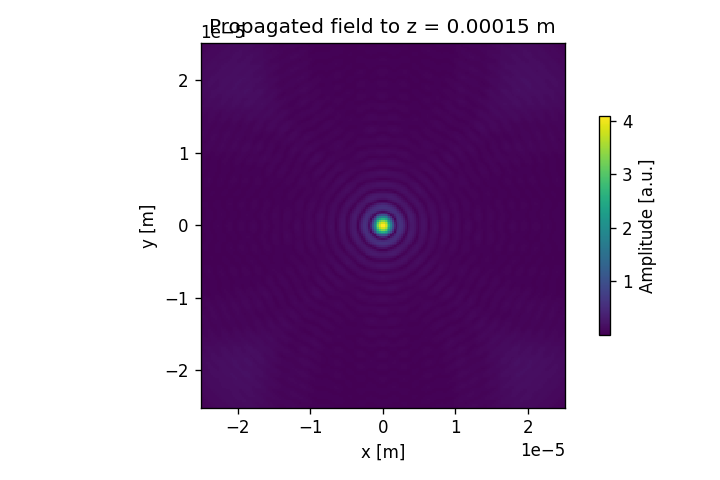

<Figure size 720x480 with 0 Axes>

In [15]:
# Plot the amplitude of the propagated field in XY screen

moe.plotting.plot_screen_XY(E_XY, which='amplitude')
plt.title("Propagated field to z = "+str(z_distance)+" m")

plt.tight_layout()
plt.show()

plt.savefig("FresnelN16-XY.png")

In [16]:
#### Propagate field and calculate in plane YZ, using 100 bins in Y

nbins_y= 20

# Creates YZ screen
screen_YZ = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, nbins_y, 
                                        zmin, zmax, nzs,
                                        x=0)

# Propagate the field 
E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, simp2d=True)


[########################################] | 100% Completed | 53.8s


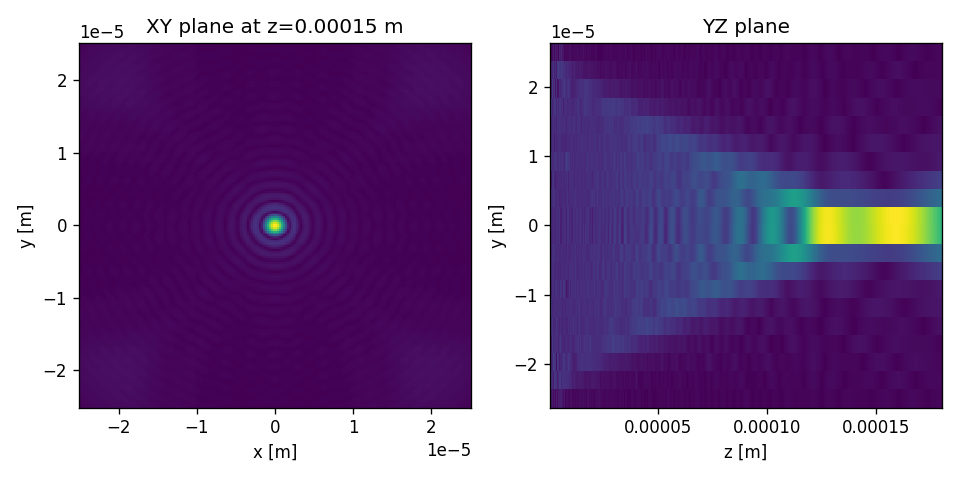

In [17]:
###Plot the two fields in same panel 
fig = plt.figure(figsize=(8,4))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)


z1 = E_XY.amplitude.reshape(len(E_XY.x),len(E_XY.y))
xp1 = np.linspace(-aperture_width/2 ,aperture_width/2, z1.shape[0])
yp1 = np.linspace(-aperture_height/2,aperture_height/2,z1.shape[1])

z2 = E_YZ.amplitude.reshape(len(E_YZ.y),len(E_YZ.z))
yp2 = np.linspace(-aperture_height/2 ,aperture_height/2,nbins_y)
zp2 = np.linspace(zmin,zmax,nzs)

ax1.title.set_text('XY plane at z='+str(focal_length)+' m')
ax1.pcolormesh(xp1,yp1,np.abs(z1) )
ax2.title.set_text('YZ plane')
ax2.pcolormesh(zp2,yp2,np.abs(z2) )


ax1.set(xlabel="x [m]", ylabel="y [m]")
ax2.set(xlabel="z [m]", ylabel="y [m]")

plt.tight_layout()

Elapsed: 0:00:16.216577


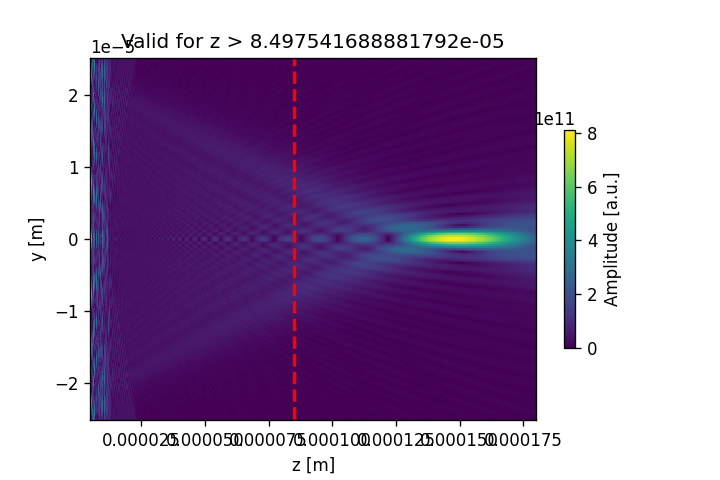

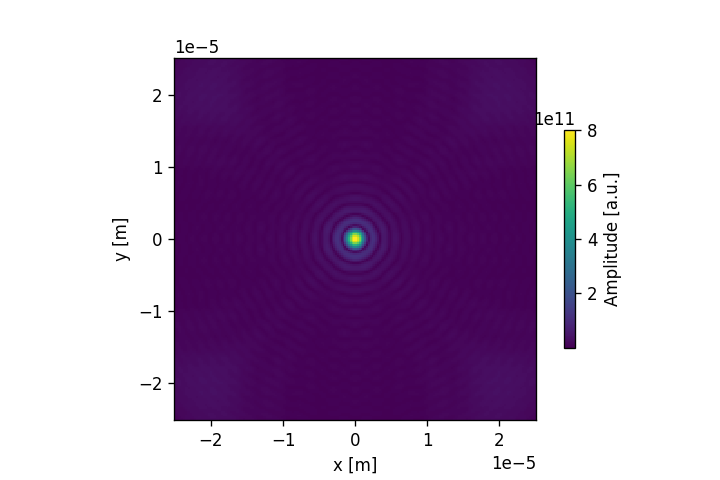

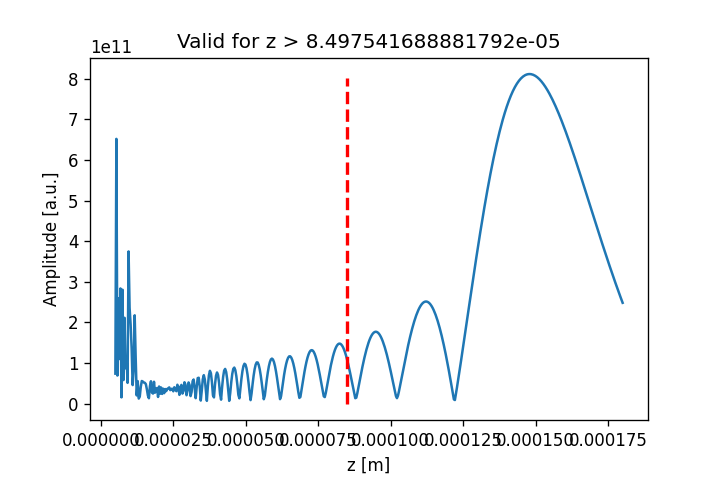

In [18]:
#Propagation using Bluestein 

###Propagate field *10and calculate in plane YZ, using npix bins in Y
zmin = wavelength*10
zmax = 1.2* focal_length
nzs = 500


# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2, aperture_height/2
xmin, xmax = -aperture_width/2, aperture_width/2

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)


screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Eyz = moe.field.Screen(0,y,z)
Eyz.screen = np.reshape(EXYZ.screen[:,int(y_pixel/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, -radius, radius, colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Exy = moe.field.Screen(x,y,focal_length)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(focal_length/zmax*nzs)], np.shape(Exy.screen[:, :, :]))

moe.plotting.plot_screen_XY(Exy, which='amplitude')

Ezz = moe.field.Screen(0,0,z)
Ezz.screen = np.reshape(EXYZ.screen[int(x_pixel/2),int(y_pixel/2),:], np.shape(Ezz.screen[:, :, :]))

moe.plotting.plot_screen_ZZ(Ezz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, 0, np.max(Ezz.screen), colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

In [19]:
# Propagates the field via RS in a single line along the Z axis
screen_ZZ = moe.field.create_screen_ZZ(zmin, zmax, nzs)
screen_ZZ = moe.propagate.RS_integral(field, screen_ZZ, wavelength, parallel_computing=True)


[########################################] | 100% Completed |  3.3s


Text(0, 0.5, 'Normalized amplitude')

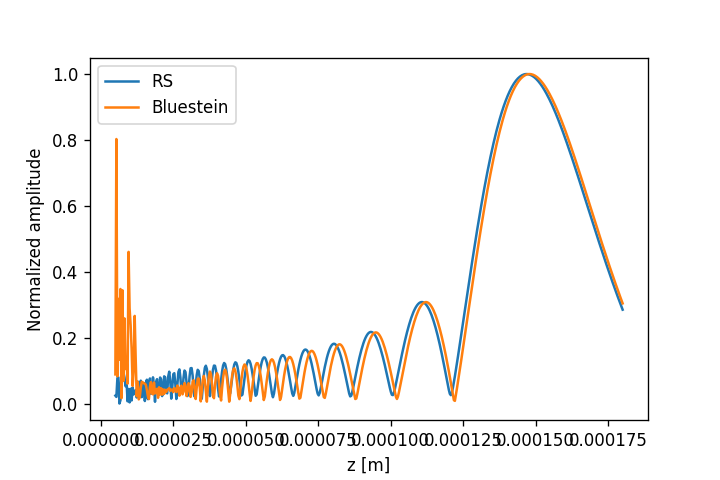

In [20]:
#compare both propagations 

fig = plt.figure() 

plt.plot(z, np.reshape(np.abs(screen_ZZ.screen)/(np.max(np.abs(screen_ZZ.screen))), np.shape(z)), label="RS")
plt.plot(z, np.reshape(np.abs(Ezz.screen)/(np.max(np.abs(Ezz.screen))), np.shape(z)), label="Bluestein")

plt.legend()

plt.xlabel("z [m]")
plt.ylabel("Normalized amplitude")

In [21]:
##Propagate field using RS integral using smaller bins 
#-> Results in a faster calculation in RS method just for fast inspection, however, use with care, due to possible bluring effects
nbins_y = 25

screen_YZ = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, nbins_y, 
                                        zmin, zmax, nzs,
                                        x=0)
screen_XY = moe.field.create_screen_XY(-aperture_width/2, aperture_width/2, nbins_y, 
                                       -aperture_height/2, aperture_height/2, nbins_y, 
                                        z=z_distance)

E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, simp2d=True)
E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength, simp2d=True)

[########################################] | 100% Completed | 59.2s
[########################################] | 100% Completed |  3.2s


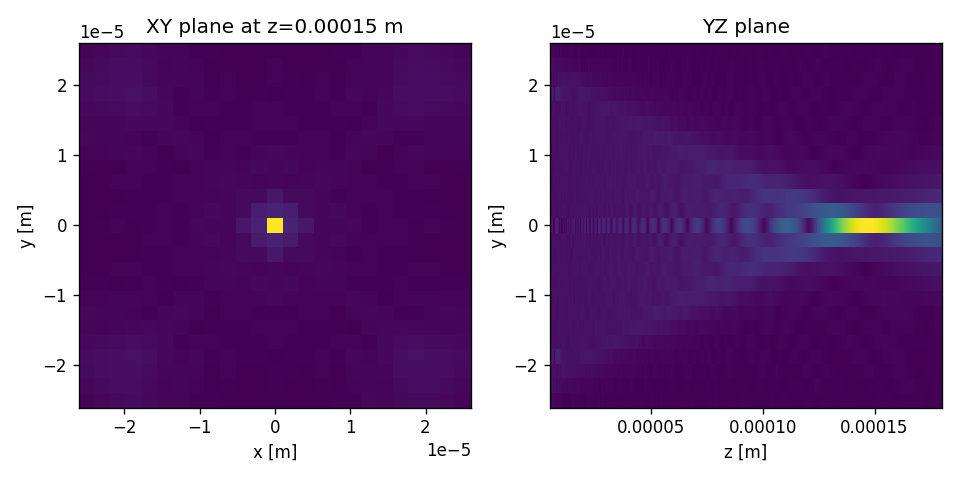

In [22]:
###Plot the two fields in same panel 
fig = plt.figure(figsize=(8,4))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)


z1 = E_XY.amplitude.reshape(len(E_XY.x),len(E_XY.y))
xp1 = np.linspace(-aperture_width/2 ,aperture_width/2, z1.shape[0])
yp1 = np.linspace(-aperture_height/2,aperture_height/2,z1.shape[1])

z2 = E_YZ.amplitude.reshape(len(E_YZ.y),len(E_YZ.z))
yp2 = np.linspace(-aperture_height/2 ,aperture_height/2,nbins_y)
zp2 = np.linspace(zmin,zmax,nzs)

ax1.title.set_text('XY plane at z='+str(focal_length)+' m')
ax1.pcolormesh(xp1,yp1,np.abs(z1) )
ax2.title.set_text('YZ plane')
ax2.pcolormesh(zp2,yp2,np.abs(z2) )


ax1.set(xlabel="x [m]", ylabel="y [m]")
ax2.set(xlabel="z [m]", ylabel="y [m]")

plt.tight_layout()

## Propagation from a Fresnel multilevel mask example #2

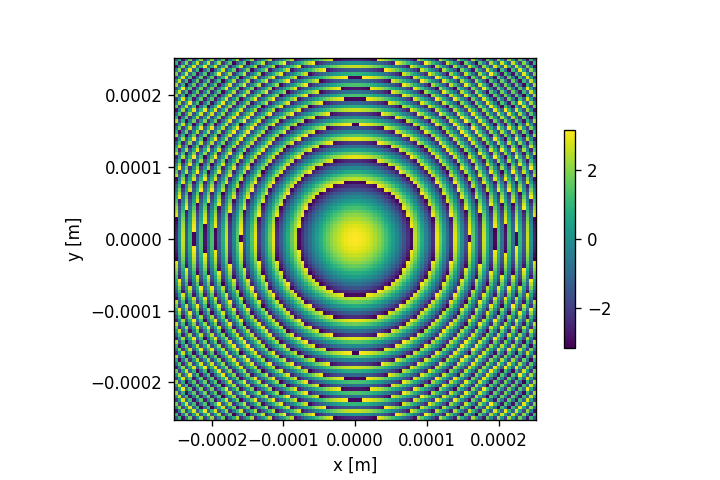

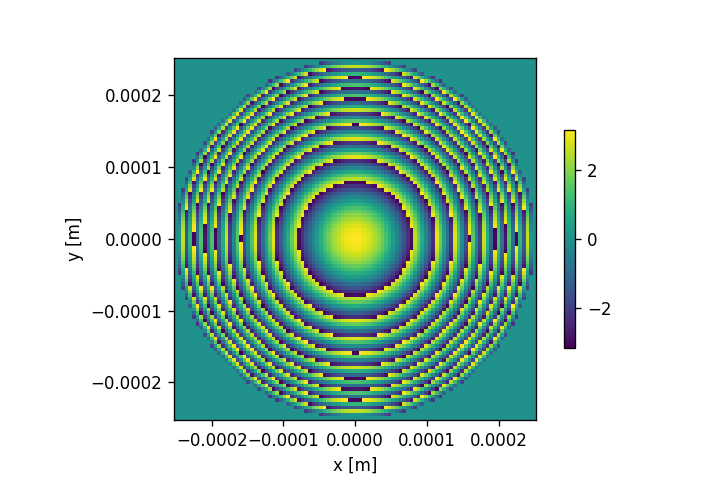

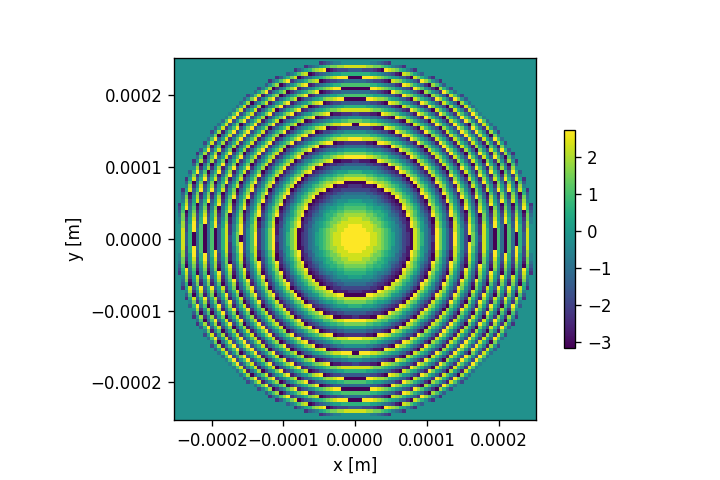

In [23]:
### Here we will apply same strategy with functions from pyMOE v1.3 

#number of pixels 
x_pixel = 100
y_pixel = 100

#size of the rectangular mask 
aperture_width  = 500e-6 #m
aperture_height = 500e-6

pixsize = aperture_width/x_pixel #m

wavelength = 632.8e-9 #m
focal_length = 5000e-6

zmin = wavelength
zmax = 1.2* focal_length
nzs = 500

radius = aperture_width/2 

# Create Aperture
aperture1 = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture with Fresnel mask 
mask1 = moe.generate.fresnel_phase(aperture1, focal_length, wavelength )

moe.plotting.plot_aperture(mask1)


##############
###Fresnel mask with a truncated circular aperture 

# Create empty mask
aperture2 = moe.generate.create_empty_aperture_from_aperture(aperture1)

# and truncate around radius
mask2 = moe.generate.fresnel_phase(aperture2, focal_length, wavelength, radius=radius)
moe.plotting.plot_aperture(mask2)

# Discretize mask in number of levels
# Select exact position of contours  in phase
phase_vals = np.linspace(-np.pi, np.pi, 16)

mask2.discretize(np.array( phase_vals)[:] ) 
moe.plotting.plot_aperture(mask2)


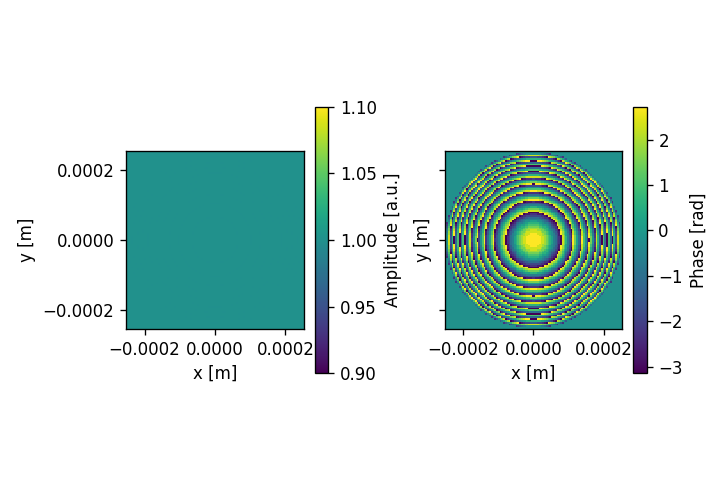

In [24]:
# Generate a uniform field
field = moe.field.create_empty_field_from_aperture(mask2)

field = moe.field.generate_uniform_field(field, E0=1)

# Modulates the field 
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask2)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


In [25]:
RS_resultsxy = moe.propagate.RS_intXY(focal_length, field.field, x_pixel, pixsize, x_pixel*4, aperture_width/2, aperture_width/2, wavelength, verbose=True)
z1 = RS_resultsxy[0] ##E field


RS_resultsyz = moe.propagate.RS_intYZ(zmin,zmax,nzs,0, field.field, x_pixel, pixsize, x_pixel, aperture_width/2, aperture_width/2, wavelength, 1, verbose=True)
z2 = RS_resultsyz[0] ##E field 

Progress: [####################] 100.0%
Elapsed: 0:07:32.909579
Progress: [####################] 100.0%
Elapsed: 0:02:16.471669


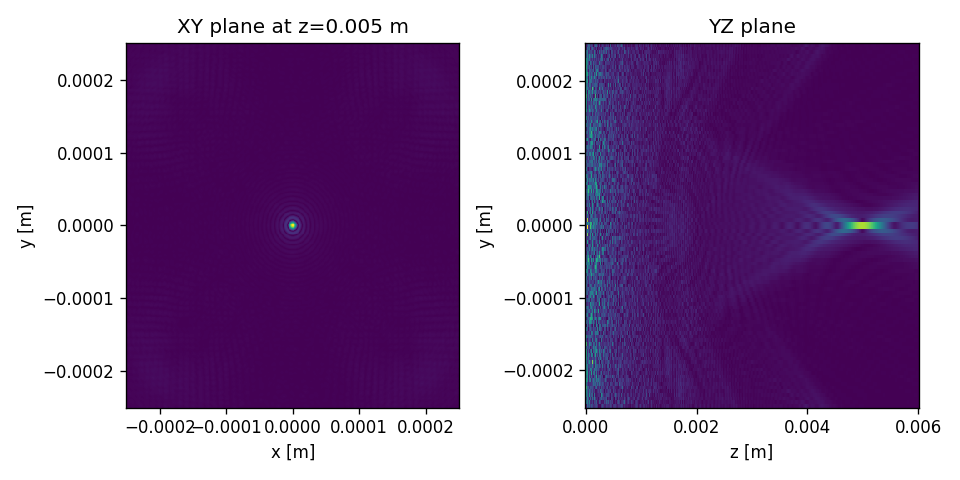

In [26]:
fig = plt.figure(figsize=(8,4))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

xp1 = np.linspace(-aperture_width/2, aperture_width/2,z1.shape[0])
yp1 = np.linspace(-aperture_height/2, aperture_height/2,z1.shape[1])

yp2 = np.linspace(-aperture_width/2, aperture_width/2,z2.shape[0])
zp2 = np.linspace(zmin,zmax,nzs)

ax1.title.set_text('XY plane at z='+str(focal_length)+' m')
ax1.pcolormesh(xp1,yp1,np.abs(z1) )
ax2.title.set_text('YZ plane')
ax2.pcolormesh(zp2,yp2,np.abs(z2) )


ax1.set(xlabel="x [m]", ylabel="y [m]")
ax2.set(xlabel="z [m]", ylabel="y [m]")

plt.tight_layout()

C:\Users\jcunha377\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


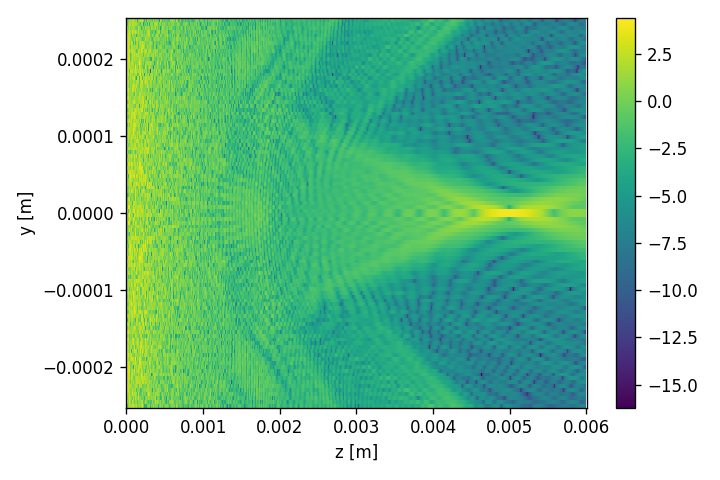

In [27]:
fig = plt.figure() 

plt.pcolormesh(zp2,yp2,np.log(np.abs(z2)**2) )
plt.colorbar()
plt.xlabel("z [m]")
plt.ylabel("y [m]")
plt.tight_layout()

plt.savefig("Zoom-YZ-log-representation.png")

## Propagation from a Fresnel Zone Plate

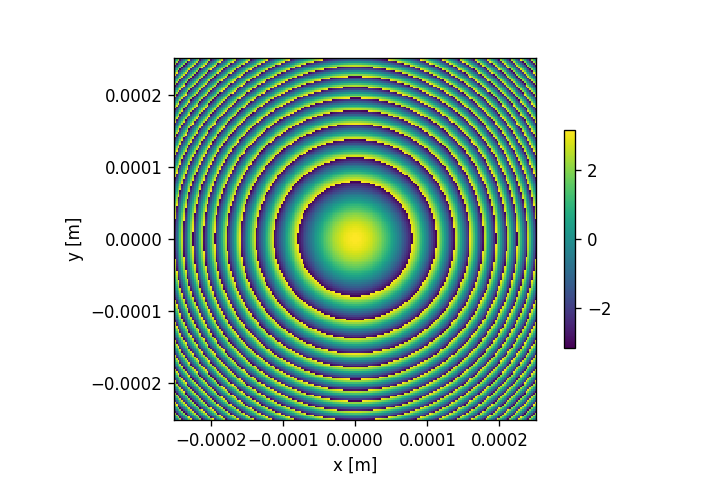

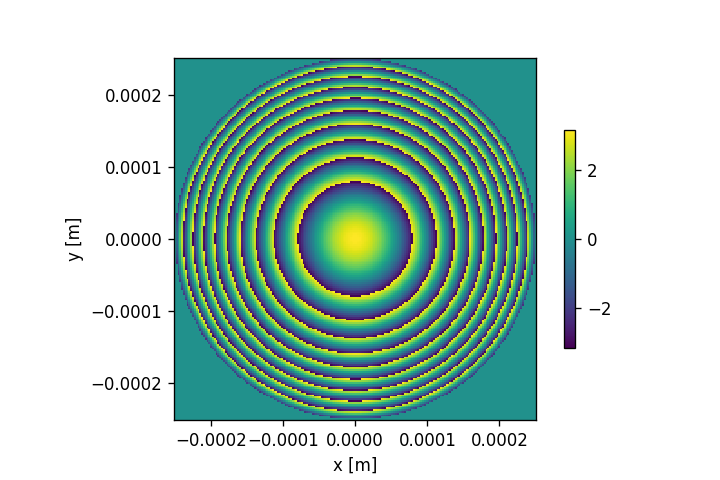

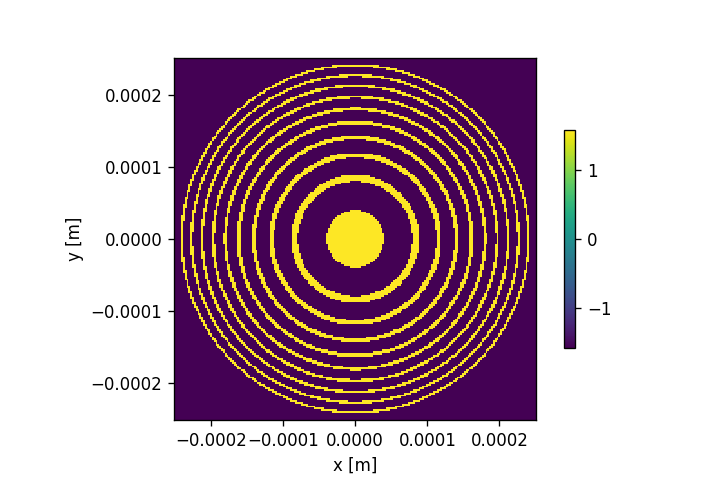

In [28]:
#### Generate a fresnel zone plate 

#number of pixels 
x_pixel = 200
y_pixel = 200

#size of the rectangular mask 
aperture_width  = 500e-6 #m
aperture_height = 500e-6

pixsize = aperture_width/x_pixel #m

wavelength = 632.8e-9 #m
focal_length = 5000e-6

zmin = wavelength
zmax = 1.2* focal_length
nzs = 256 

radius = aperture_width/2 

# Create Aperture
aperture1 = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture with Fresnel mask 
mask1 = moe.generate.fresnel_phase(aperture1, focal_length, wavelength )

moe.plotting.plot_aperture(mask1)


##############
###Fresnel mask with a truncated circular aperture 

# Create empty mask
aperture2 = moe.generate.create_empty_aperture_from_aperture(aperture1)

# and truncate around radius
mask2 = moe.generate.fresnel_phase(aperture2, focal_length, wavelength, radius=radius)
moe.plotting.plot_aperture(mask2)

# Discretize mask in number of levels
# Select exact position of contours  in phase
phase_vals = [ -np.pi/2, np.pi/2]

mask2.discretize(np.array( phase_vals)[:] ) 
moe.plotting.plot_aperture(mask2)


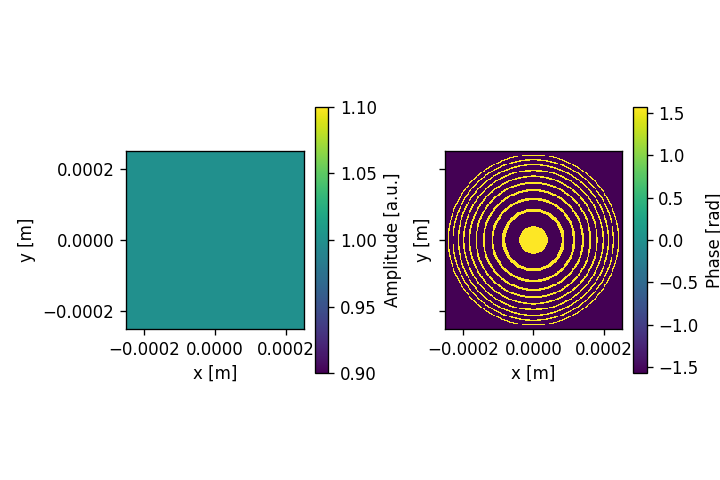

In [29]:
# Generate a uniform field
field = moe.field.create_empty_field_from_aperture(mask2)

field = moe.field.generate_uniform_field(field, E0=1)

# Modulates the field 
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask2)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


[########################################] | 100% Completed |  2.3s


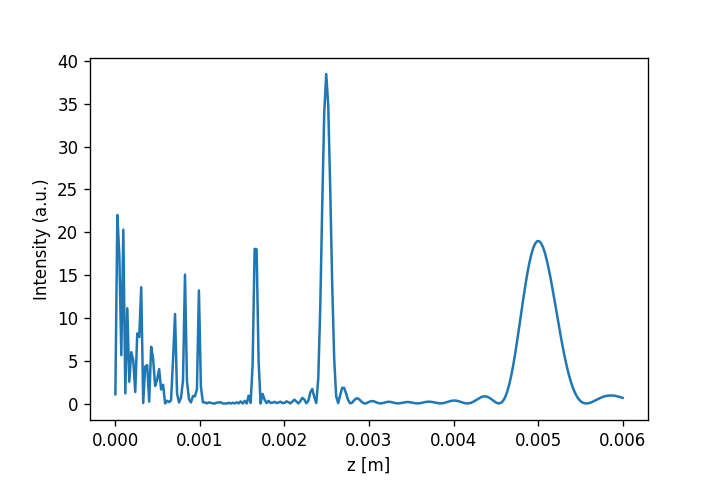

In [30]:
# Propagates the field in a single line along the Z axis
screen_ZZ = moe.field.create_screen_ZZ(zmin, zmax, nzs)
E_ZZ = moe.propagate.RS_integral(field, screen_ZZ, wavelength)

# Get the intensity 
I_ZZ = E_ZZ.amplitude[0,0,:]**2


# Plot the intensity 
fig = plt.figure() 

zp = np.linspace(zmin,zmax,nzs)

plt.plot(zp, I_ZZ)
plt.xlabel("z [m]")
plt.ylabel("Intensity (a.u.)")

plt.savefig("FZP-Zprop.png")

In [31]:
#### Propagate field and calculate in plane YZ, using 100 bins in Y

nbins_y= x_pixel

# Creates YZ screen
screen_YZ = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, nbins_y, 
                                        zmin, zmax, nzs,
                                        x=0)

# Propagate the field 
E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, simp2d=True)


[########################################] | 100% Completed |  4min 52.3s


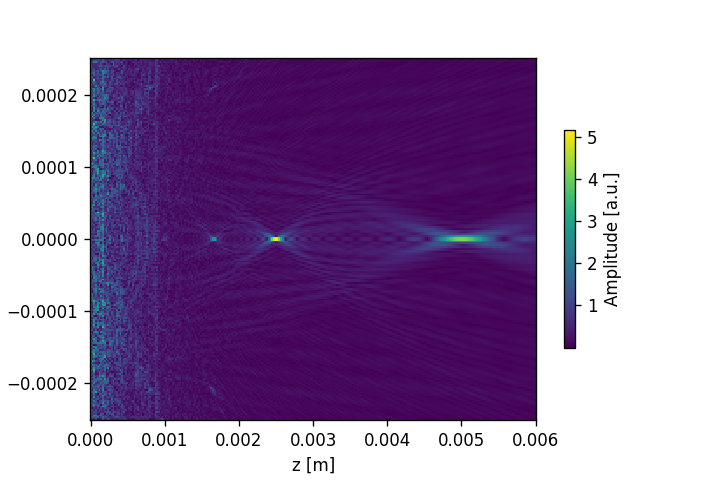

<Figure size 720x480 with 0 Axes>

In [32]:
#Plot the amplitude of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='amplitude')
plt.show()

plt.savefig("FresnelN2-YZ.png")

Elapsed: 0:00:14.614555


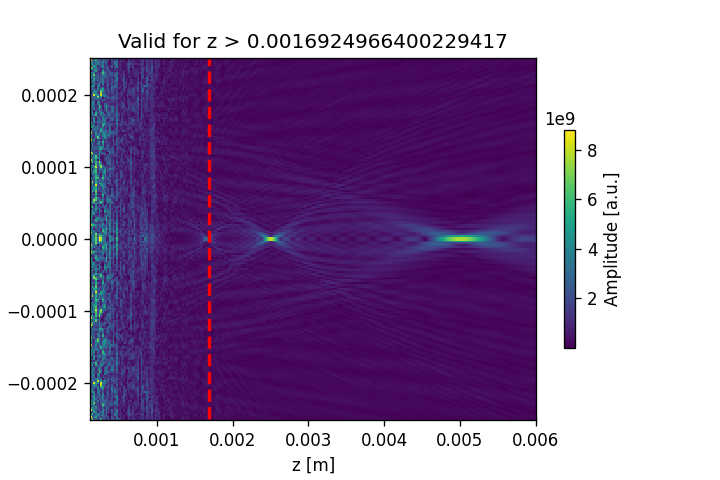

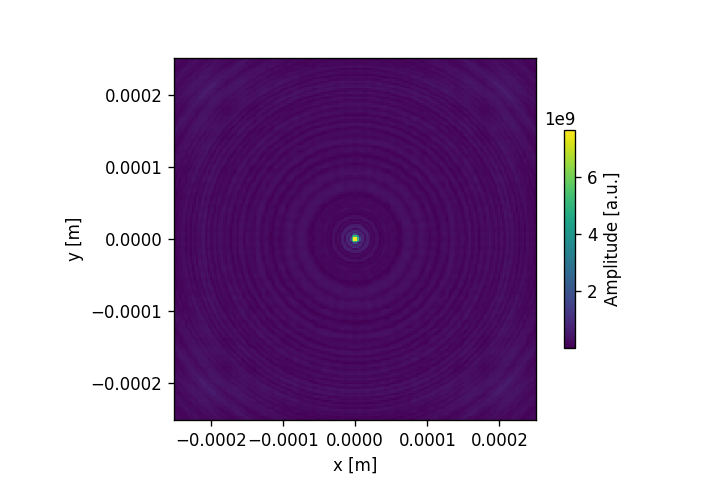

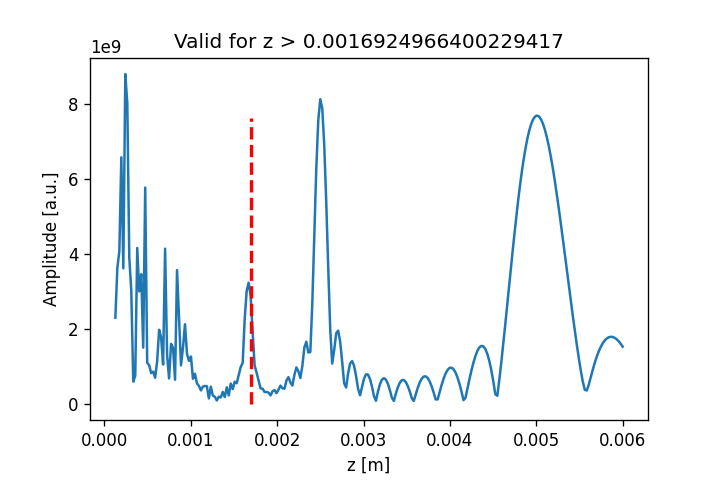

In [33]:
# Propagate via Bluestein 

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2, aperture_height/2
xmin, xmax = -aperture_width/2, aperture_width/2

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin*200, zmax, nzs)


screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Eyz = moe.field.Screen(0,y,z)
Eyz.screen = np.reshape(EXYZ.screen[:,int(y_pixel/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, -radius, radius, colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Exy = moe.field.Screen(x,y,focal_length)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(focal_length/zmax*nzs)], np.shape(Exy.screen[:, :, :]))

moe.plotting.plot_screen_XY(Exy, which='amplitude')

Ezz = moe.field.Screen(0,0,z)
Ezz.screen = np.reshape(EXYZ.screen[int(x_pixel/2),int(y_pixel/2),:], np.shape(Ezz.screen[:, :, :]))

moe.plotting.plot_screen_ZZ(Ezz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, 0, np.max(Ezz.screen), colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Text(0, 0.5, 'Normalized amplitude')

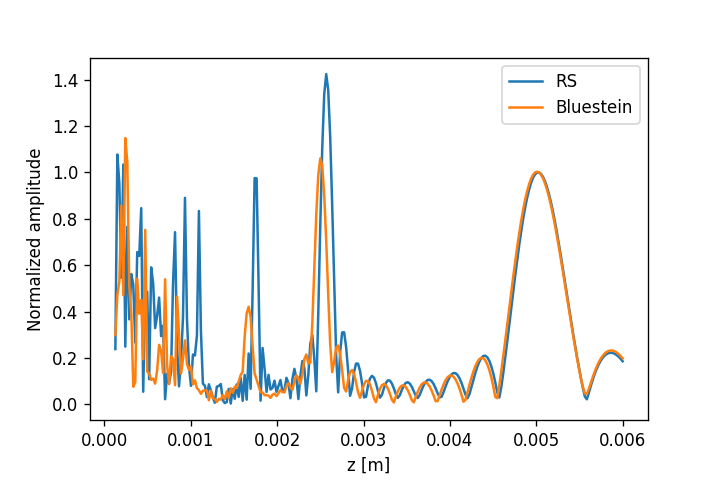

In [34]:
fig = plt.figure() 

plt.plot(z, np.reshape(np.abs(screen_ZZ.screen)/(np.abs(screen_ZZ.screen[0,0,int(focal_length/zmax*nzs)])), np.shape(z)), label="RS")
plt.plot(z, np.reshape(np.abs(Ezz.screen)/(np.abs(Ezz.screen[0,0,int(focal_length/zmax*nzs)])), np.shape(z)), label="Bluestein")

plt.legend()

plt.xlabel("z [m]")
plt.ylabel("Normalized amplitude")

## Propagation from a Spiral Phase Plate

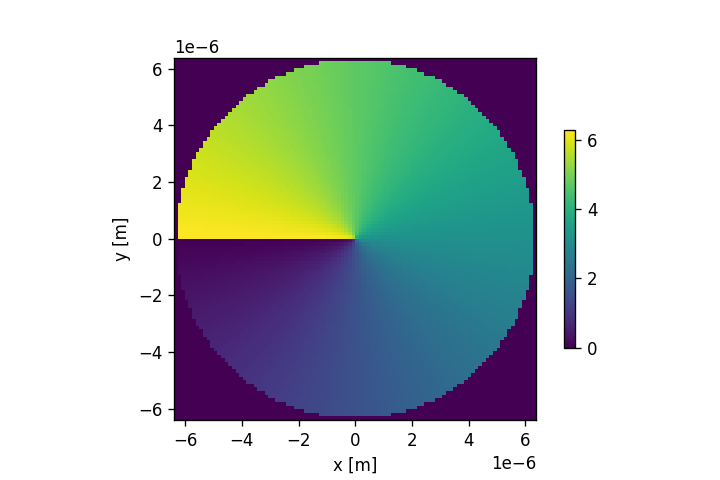

In [35]:
### Spiral Phase plate 

npix = 100 # nr of pixels 

wavelength = 632.8e-9 #wavelength in m 
z_distance = 100*wavelength # propagation distance

aperture_width = 20*wavelength  #x-size in m 
aperture_height = 20*wavelength #y-size in m

pixsize = aperture_width/npix

ltop = 1 #topological number

#spiral mask is defined as  
#spiral(x,y,x0,y0,ltop)
    
def spiral(x,y,x0,y0,L):
    """
    returns a spiral COMPLEX PHASE with input meshgrid (x,y) with center at (x0,y0)
    x = x array from meshgrid 
    y = y array from meshgrid 
    x0 = x-coordinate of center of the lens 
    y0 = y-coordinate of center of the lens
    L = topological charge 
    """

    theta = np.arctan2((y-y0),(x-x0))
    sp = np.exp(1.0j*L*theta)
    return sp
    

n =10 # number of gray levels 

center = (0, 0)

aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, npix, -aperture_height/2, aperture_height/2, npix)
mask =  moe.generate.arbitrary_aperture_function(aperture, moe.sag.spiral, center=center, L=ltop)
mask.aperture = mask.aperture + np.pi 

mask.aperture[np.where(mask.XX**2+mask.YY**2>(aperture_width/2)**2 ) ] = 0 
moe.plotting.plot_aperture(mask)

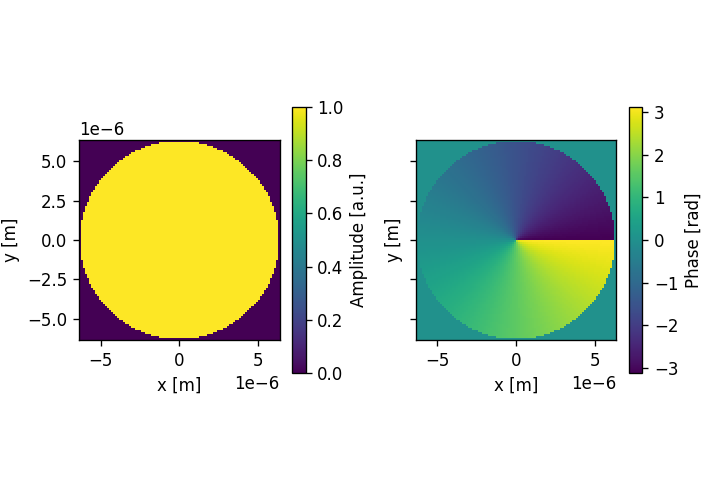

In [36]:
# Generate a uniform field
field = moe.field.create_empty_field_from_aperture(mask)

field = moe.field.generate_uniform_field(field, E0=1)

aperture = moe.generate.create_empty_aperture_from_aperture(mask)

mask_circle = moe.generate.circular_aperture(aperture, radius=aperture_width/2)

# Modulates the field 
field = moe.field.modulate_field(field, amplitude_mask=mask_circle, phase_mask=mask)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


In [37]:
##Propagate field in plane XY at z_distance

# Creates XY screen
screen_XY = moe.field.create_screen_XY(-aperture_width/2, aperture_width/2, npix, 
                                       -aperture_height/2, aperture_height/2, npix, 
                                        z=z_distance)

# Propagate the field
E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength, simp2d=True)


[########################################] | 100% Completed | 35.5s


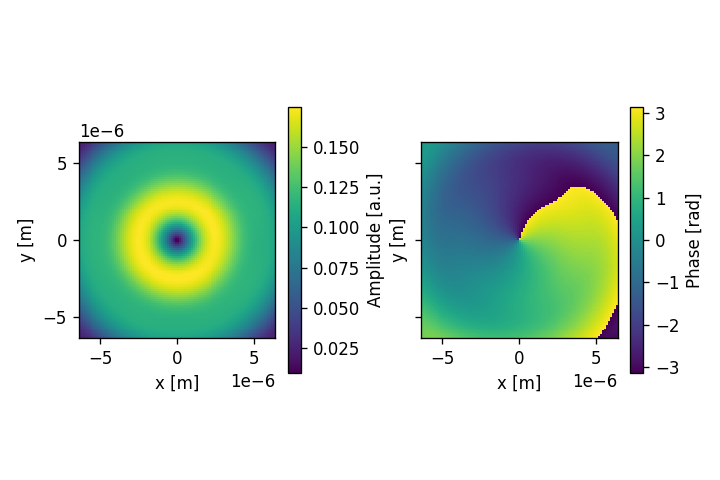

<Figure size 720x480 with 0 Axes>

In [38]:
# Plot the amplitude of the propagated field in XY screen

moe.plotting.plot_screen_XY(E_XY)
#plt.title("z = "+str(z_distance)+" m")

plt.tight_layout()
plt.show()

plt.savefig("Spiral-N16-XY.png")

In [39]:
#### Propagate field and calculate in plane YZ

nbins_y = x_pixel
zmin = wavelength 
zmax = 2 * z_distance
nzs = 500 

# Creates YZ screen
screen_YZ = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, nbins_y, 
                                        zmin, zmax, nzs,
                                        x=0)

# Propagate the field 
E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, simp2d=True)


[########################################] | 100% Completed |  5min 56.1s


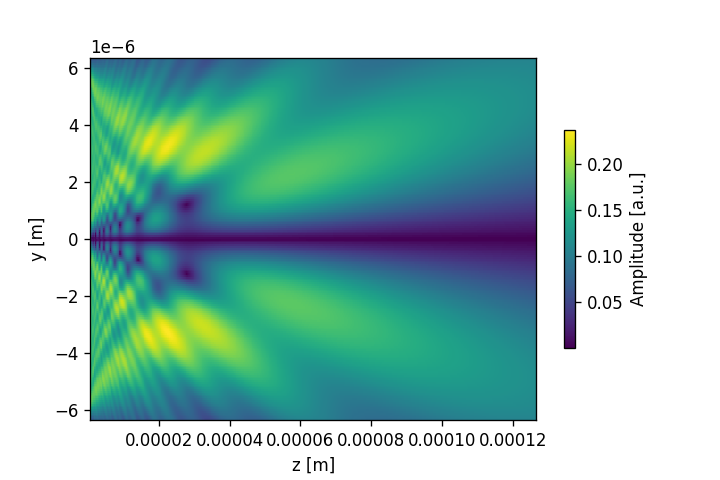

<Figure size 720x480 with 0 Axes>

In [40]:
#Plot the amplitude of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='amplitude')
plt.show()


plt.savefig("Spiral-YZ.png")

## Propagation from Alvarez Lenses Pair

In [19]:
# Creates an Alvarez lens pair masks
# evaluates the produced focal spot by the displaced lenses using the propagation
aperture_width = 1000*micro
aperture_height = 500*micro
x_pixel = 1000
y_pixel = 500


# focal range of the Alvarez lenses
f1 = 500*micro
f2 = 15000*micro
tuning_distance = 100*micro
wavelength = 1550*nano

#nr of levels 
n = 8

# First lens
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel,)
lens1 =  moe.generate.arbitrary_aperture_function(aperture, moe.sag.Alvarez_phase, f1=f1, f2=f2, tuning_distance=tuning_distance, wavelength=wavelength)

lens1.modulos(2*np.pi)
lens1.discretize(n)

# Second lens which is the same but flipped.
aperture2 = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel,)

lens2 =  moe.generate.arbitrary_aperture_function(aperture2, moe.sag.Alvarez_phase, f1=f1, f2=f2, tuning_distance=tuning_distance, wavelength=wavelength)
lens2.aperture = np.fliplr(lens2.aperture)

lens2.modulos(2*np.pi)
lens2.discretize(n)

# initializes an aperture to store the result
result = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel,)


# displace aperture equally both ways, total displacement is twice displacement
displacement = 12*micro
rollidx = int(np.round(displacement/lens1.pixel_x,))

roll = rollidx
lens1.aperture = np.roll(lens1.aperture, -roll, axis=1)
lens2.aperture = np.roll(lens2.aperture, roll, axis=1)

lens1.aperture[:,-roll:] = 0
lens2.aperture[:,:roll] = 0


# Calculates the resulting aperutre by the sum of both displaced lens1 and lens2
result.aperture = -lens1.aperture - lens2.aperture

result.modulos(2*np.pi)

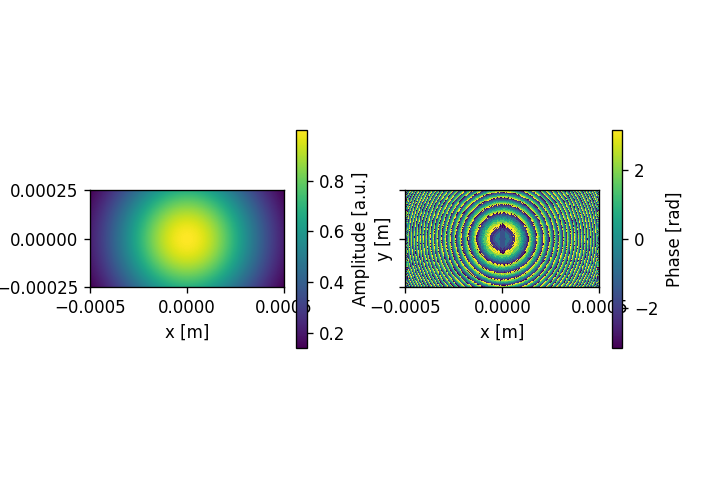

In [20]:
# Creates a mask from the result, and modulates the phase of a gaussian field

mask = result
field = moe.field.create_empty_field_from_aperture(mask)
field = moe.field.generate_gaussian_field(field, E0=1, w0=400*micro)

field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask)

moe.plotting.plot_field(field)


[########################################] | 100% Completed | 13min  1.7s


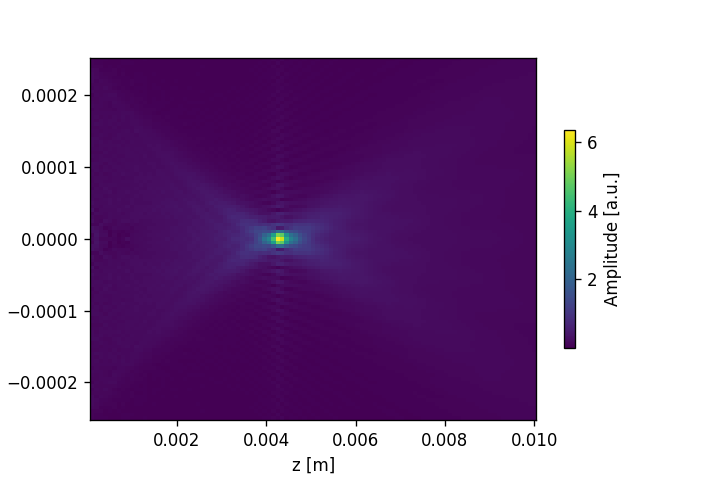

In [21]:
screen_YZ = moe.field.create_screen_YZ(-250*micro,250*micro, 101, 100*micro, 10000*micro, 101)
E_YZ = moe.propagate.RS_integral(field, screen_YZ, wavelength, )

moe.plotting.plot_screen_YZ(E_YZ, which='amplitude')

[########################################] | 100% Completed | 14.6s


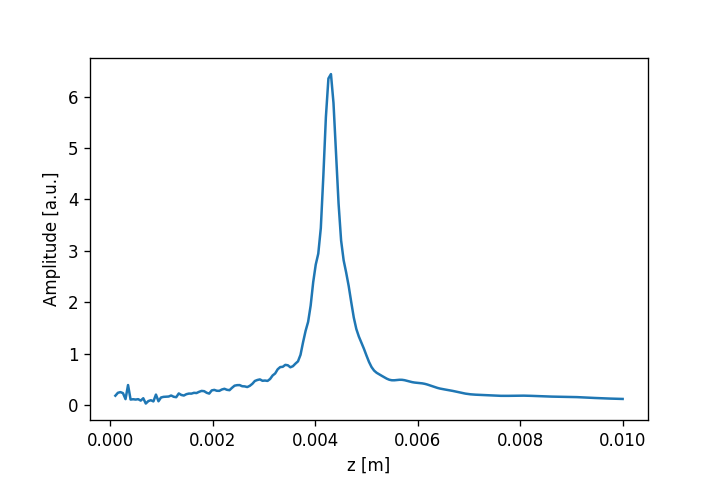

In [22]:
screen_ZZ = moe.field.create_screen_ZZ(100*micro, 10000*micro, 201)
E_ZZ = moe.propagate.RS_integral(field, screen_ZZ, wavelength)

moe.plotting.plot_screen_ZZ(E_ZZ, which='amplitude')

[########################################] | 100% Completed |  1min  8.0s


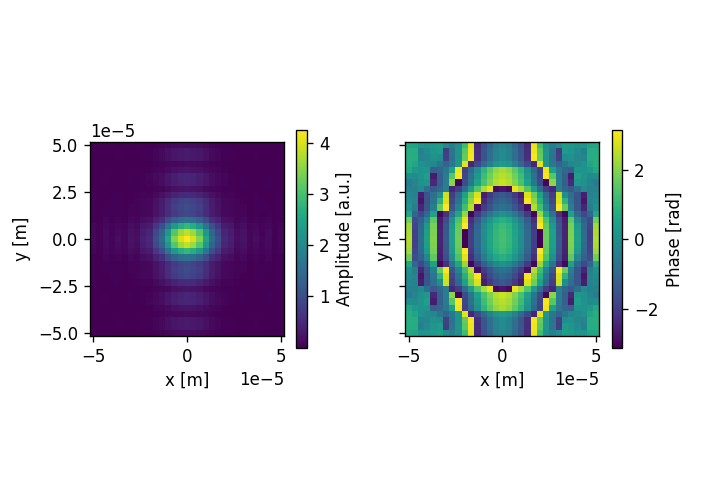

In [23]:
screen_XY = moe.field.create_screen_XY(-50*micro,50*micro, 31, 
                                        -50*micro,50*micro, 31, 
                                        z=4150*micro)

E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength)

moe.plotting.plot_screen_XY(E_XY)

In [24]:
# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -250*micro,250*micro
xmin, xmax = -500*micro,500*micro


zmin, zmax, nzs = 100*micro, 10000*micro, 201

x = np.linspace(xmin, xmax, 1000)
y = np.linspace(ymin, ymax, 500)
z = np.linspace(zmin, zmax, nzs)

focal_length = 4150*micro


screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Elapsed: 0:01:53.647803


(500, 1, 201)


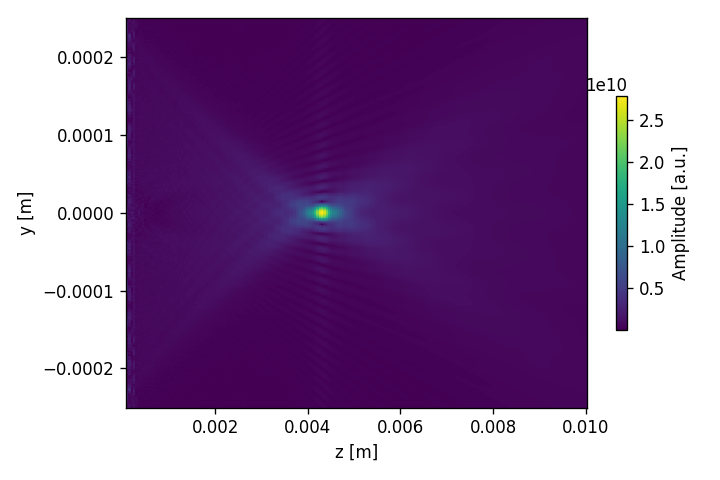

In [25]:
Eyz = moe.field.Screen(0,y,z)
print(np.shape(Eyz.screen))
Eyz.screen = np.reshape(EXYZ.screen[:,int(len(x)/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')
plt.tight_layout() 
plt.show()

(500, 1, 201)


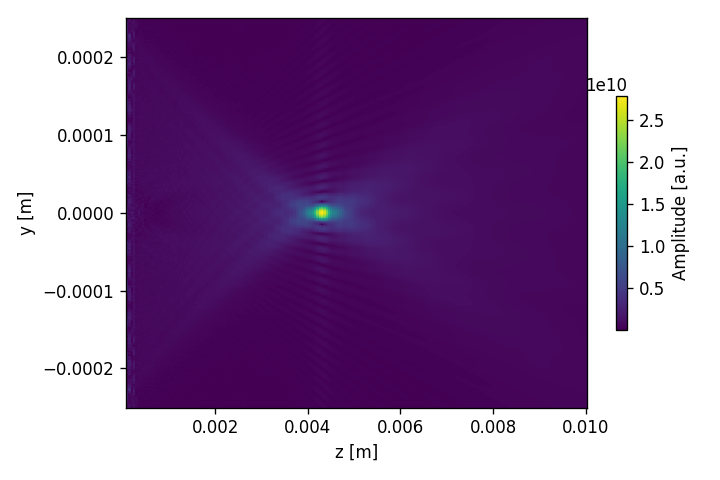

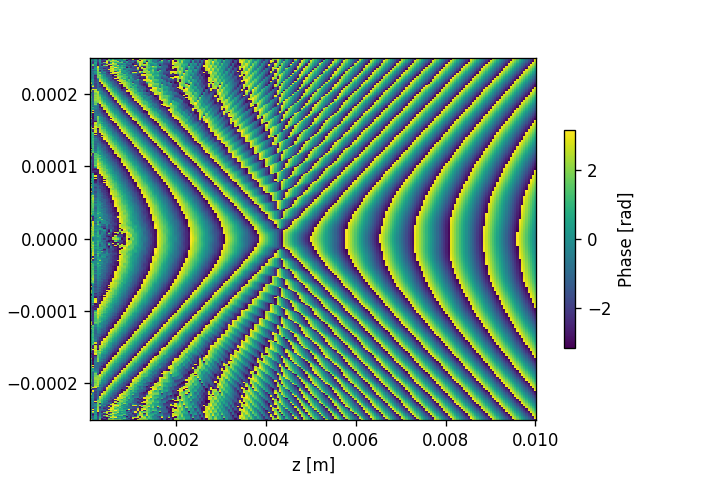

In [26]:
Eyz = moe.field.Screen(0,y,z)
print(np.shape(Eyz.screen))
Eyz.screen = np.reshape(EXYZ.screen[:,int(len(x)/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')
plt.tight_layout() 
plt.show()
moe.plotting.plot_screen_YZ(Eyz, which='phase')

C:\Users\jcunha377\AppData\Local\Programs\Python\Python37\lib\site-packages\numpy\ma\core.py:3379: ComplexWarning: Casting complex values to real discards the imaginary part
  _data[indx] = dval


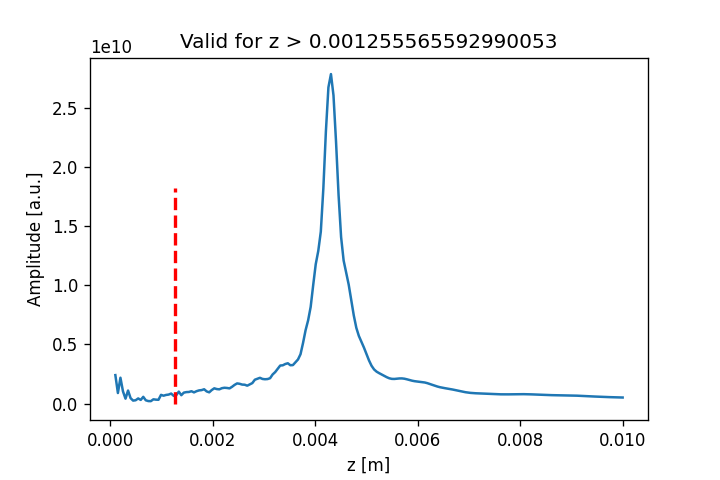

In [27]:
Ezz = moe.field.Screen(0,0,z)
Ezz.screen = np.reshape(EXYZ.screen[int(y_pixel/2),int(x_pixel/2),:], np.shape(Ezz.screen[:, :, :]))
#I_YZ.screen= np.abs(E_YZ.amplitude)**2 ## careful with multiple assertions this way

moe.plotting.plot_screen_ZZ(Ezz, which='amplitude')

radius= ymax
limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, 0, np.max(Ezz.screen), colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Text(0, 0.5, 'Normalized amplitude')

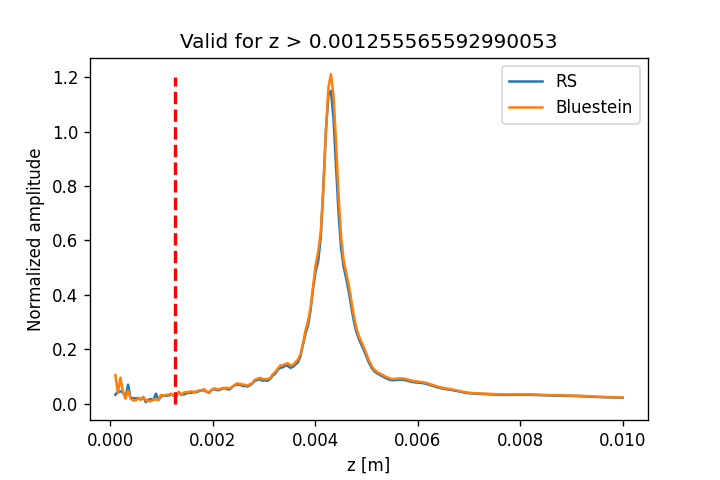

In [28]:
fig = plt.figure() 

plt.plot(z, np.reshape(np.abs(screen_ZZ.screen)/(np.abs(screen_ZZ.screen[0,0,int(focal_length/zmax*nzs)])), np.shape(z)), label="RS")
plt.plot(z, np.reshape(np.abs(Ezz.screen)/(np.abs(Ezz.screen[0,0,int(focal_length/zmax*nzs)])), np.shape(z)), label="Bluestein")

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
plt.vlines(limitx, 0, np.max(1.2), colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.legend()

plt.xlabel("z [m]")
plt.ylabel("Normalized amplitude")

## Propagation from Dammann Gratings

In [29]:
# Generates and propagates a Dammann grating phase 

aperture_width = 100*micro
aperture_height = 100*micro
x_pixel = 100
y_pixel = 100

aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel,)


transitions_x = [0.242, 0.414]
transitions_y = [0.242, 0.414]


period_x = period_y = 10*micro


mask =  moe.generate.arbitrary_aperture_function(aperture, moe.sag.dammann_2d, transitions_x=transitions_x, period_x=period_x, transitions_y=transitions_y, period_y=period_y)

mask.aperture = mask.aperture*np.pi/2 + np.pi/2

aperture2 = moe.generate.create_empty_aperture(-aperture_width/2+50*aperture.pixel_x, \
                                              aperture_width/2+50*aperture.pixel_x, x_pixel+500, \
                                              -aperture_height/2+50*aperture.pixel_y, \
                                              aperture_height/2+50*aperture.pixel_y, y_pixel+500,)


aperture2.aperture = mask.aperture

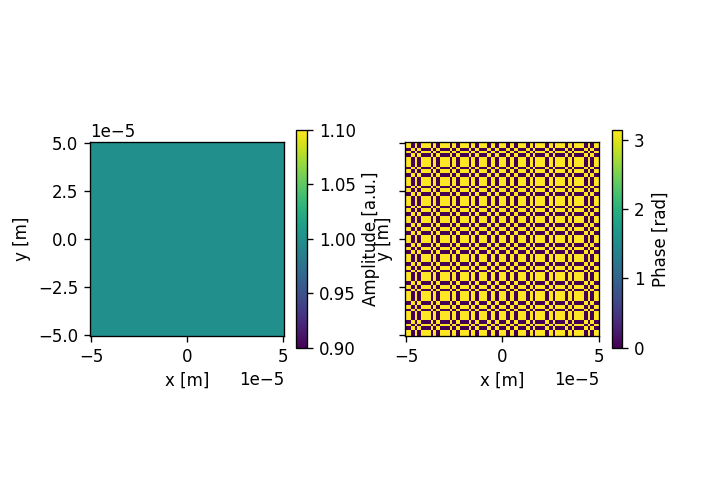

In [30]:
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, len(aperture.x), \
                                              -aperture_height/2, aperture_height/2, len(aperture.y),)
aperture.aperture = aperture2.aperture

field = moe.field.create_empty_field_from_aperture(aperture)
field = moe.field.generate_uniform_field(field, E0=1)
#field = moe.field.generate_gaussian_field(field, E0=1, w0=400*micro)

field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=aperture)


moe.plotting.plot_field(field)

In [31]:
# define the wavelength used in the propagation
wavelength = 1550*nano

# Define the screen size and create it
screen_width = 5000*micro
screen_height = 5000*micro
x_pixel =125
y_pixel = 125

screen_XY = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
                                     -screen_height/2, screen_height/2, y_pixel, 
                                     z=3500*micro)

#propagate with RS 
E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength)



[########################################] | 100% Completed | 55.7s


In [32]:
Exy_init = E_XY 

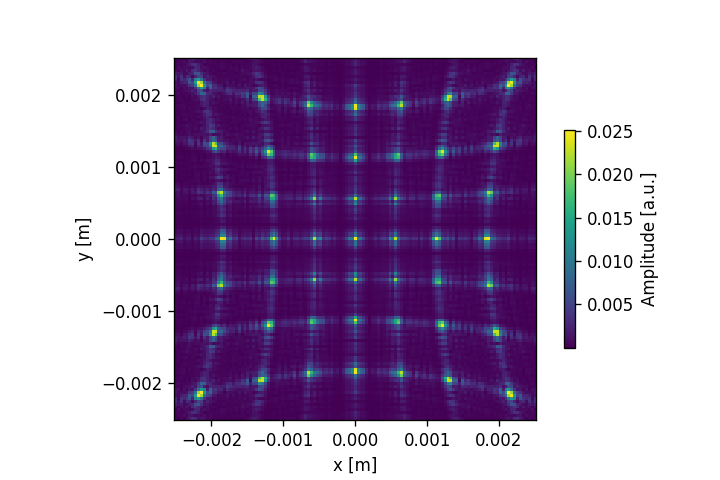

In [33]:
moe.plotting.plot_screen_XY(Exy_init, which='amplitude')
#moe.plotting.plot_screen_XY(Exy_init, which='phase')

(1197, 1197)
(1197, 1197)
Elapsed: 0:00:01.552452


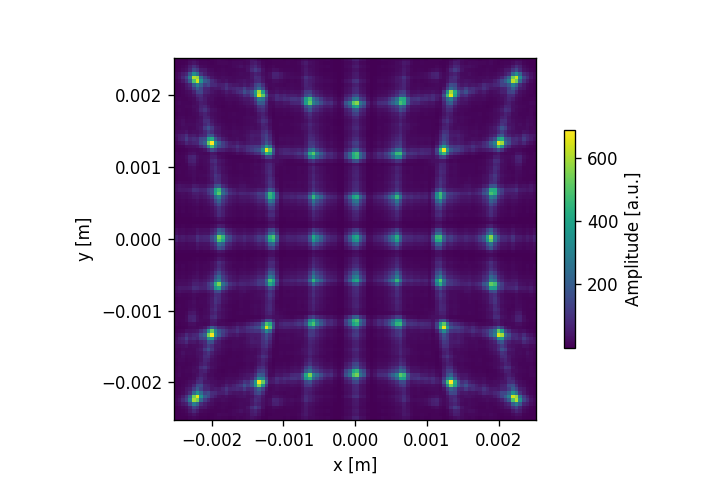

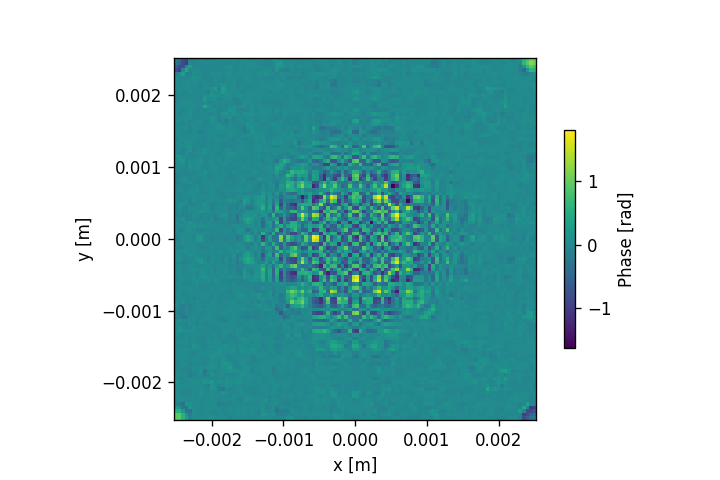

In [34]:
x = np.linspace(-screen_width/2, screen_width/2, 256)
y = np.linspace(-screen_height/2, screen_height/2, 256)
#z = np.linspace(wavelength, 3500*micro, 100)
z = [3500*micro]

screenx = moe.field.Screen(x,y,z)

#propagate with SASM
E_XY2 = moe.propagate.SASM(field, screenx, wavelength, pad_factor =13, crop = True)

moe.plotting.plot_screen_XY(E_XY2, which='amplitude')
moe.plotting.plot_screen_XY(E_XY2, which='phase')


Elapsed: 0:00:00.012000


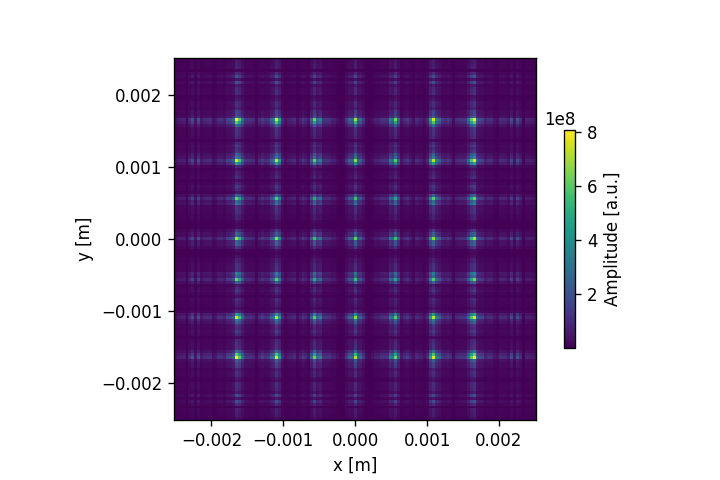

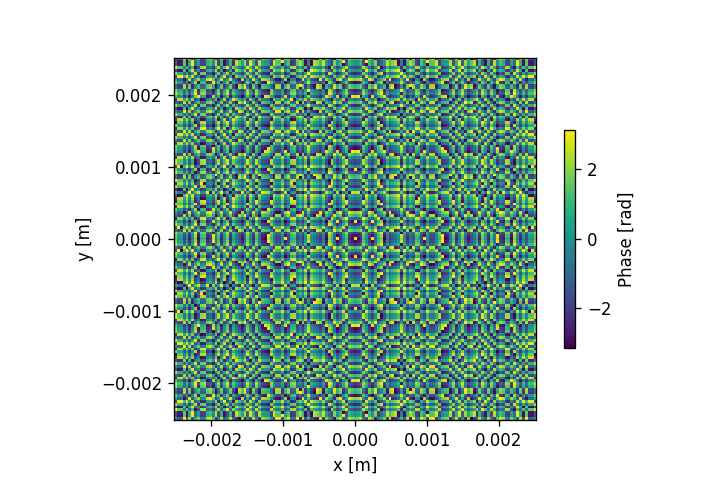

In [35]:
x = np.linspace(-screen_width/2, screen_width/2, x_pixel)
y = np.linspace(-screen_height/2, screen_height/2, y_pixel)
z = [3500*micro]

screenx = moe.field.Screen(x,y,z)

screen_XY2 = screenx

#propagate with bluestein 
E_XY2 = moe.propagate.Bluestein(field, screenx, wavelength)

moe.plotting.plot_screen_XY(E_XY2, which='amplitude')
moe.plotting.plot_screen_XY(E_XY2, which='phase')

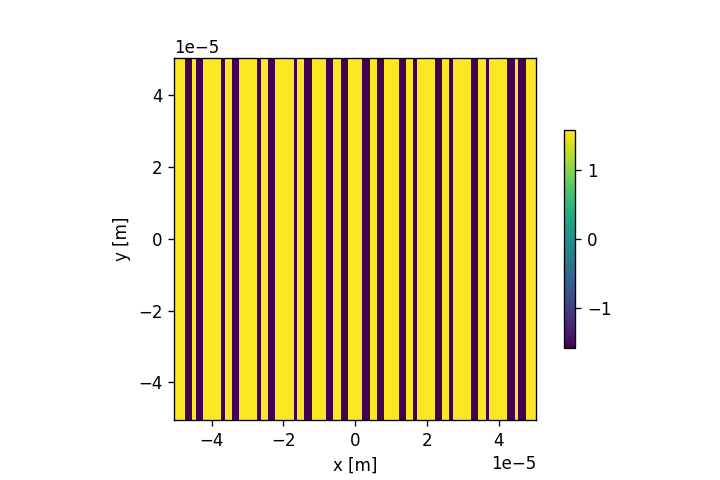

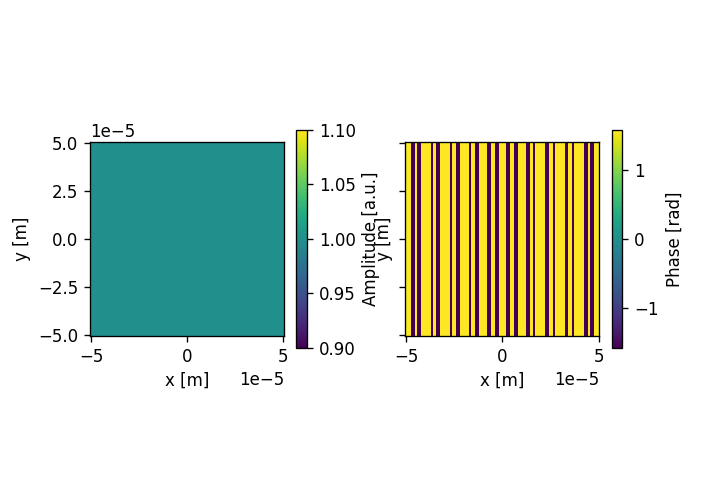

In [36]:
# Generates and propagates a Dammann grating phase 

aperture_width = 100*micro
aperture_height = 100*micro
x_pixel = 100
y_pixel = 100

aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel,)


transitions_x = [0.132, 0.48]
transitions_x = [0.242, 0.414]
#transitions_x = [0.1, 0.136,0.37, 0.498]
#transitions_y = [0.1, 0.3]
transitions_y = None

period_x = period_y = 10*micro

# mask =  moe.generate.arbitrary_aperture_function(aperture, moe.sag.dammann_2d, L=L)
mask =  moe.generate.arbitrary_aperture_function(aperture, moe.sag.dammann_2d, transitions_x=transitions_x, period_x=period_x, transitions_y=transitions_y, period_y=period_y)

mask.aperture = mask.aperture*np.pi/2


moe.plotting.plot_aperture(mask)


field = moe.field.create_empty_field_from_aperture(mask)
field = moe.field.generate_uniform_field(field, E0=1)
# field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=None)
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask)


moe.plotting.plot_field(field)

[########################################] | 100% Completed |  4min 23.5s


Text(0, 0.5, 'Amplitude [a.u.]')

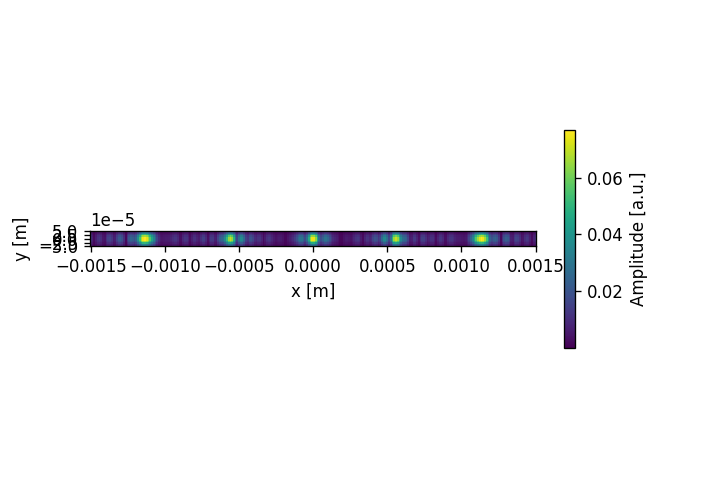

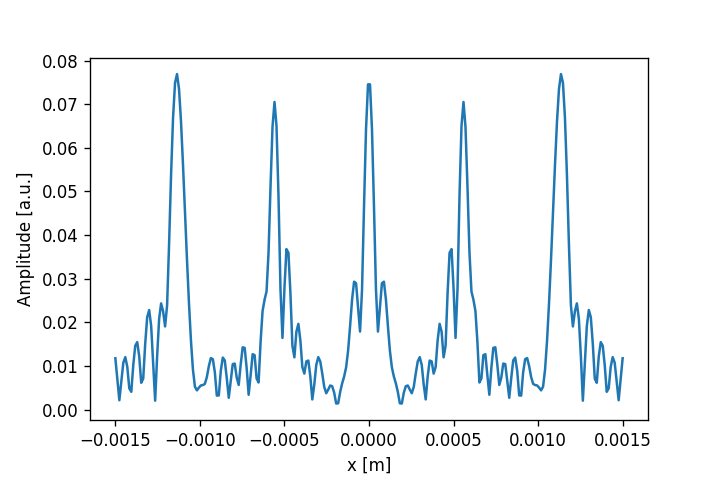

In [37]:
# define the wavelength used in the propagation
wavelength = 1550*nano

# Define the screen size and create it
screen_width = 3000*micro
screen_height = 3000*micro
x_pixel =256
y_pixel = 256

screen_XY = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
                                     -screen_height/2, screen_height/2, y_pixel, 
                                     z=3500*micro)

E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength)

moe.plotting.plot_screen_XY(E_XY, which='amplitude')
plt.ylim(-aperture_height/2, aperture_height/2)

fig = plt.figure() 

xmat= E_XY.amplitude[:,:,0]
y= xmat[int(xmat.shape[0]/2),:]
x = E_XY.x

plt.plot(x,y)
plt.xlabel("x [m]")
plt.ylabel("Amplitude [a.u.]")

Elapsed: 0:00:00.059994


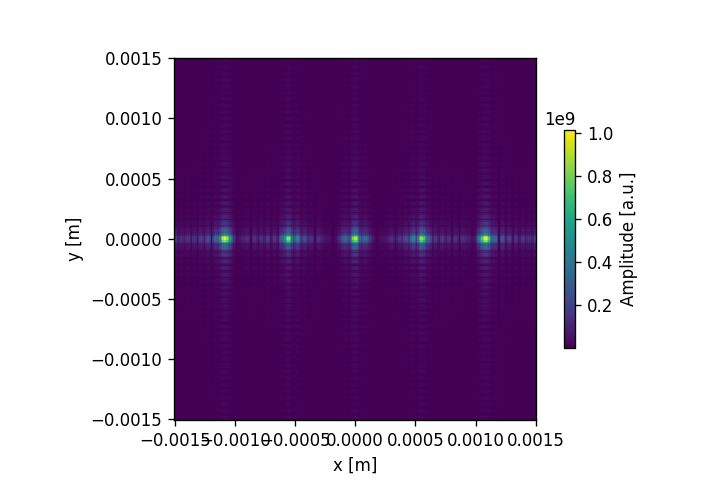

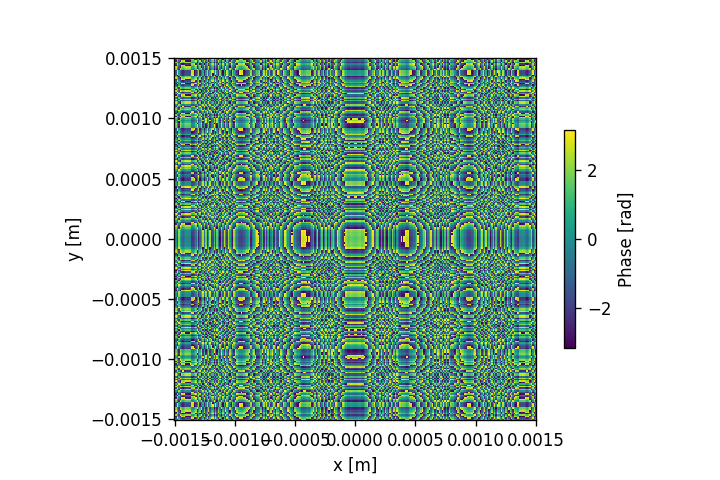

In [38]:
# define the wavelength used in the propagation
wavelength = 1550*nano

screen_width = 3000*micro
screen_height = 3000*micro
x_pixel =256
y_pixel = 256

screen_XY = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
                                     -screen_height/2, screen_height/2, y_pixel, 
                                     z=3500*micro)

#E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength
                                 
#x = np.linspace(-screen_width/2, screen_width/2, x_pixel*5)
#y = np.linspace(-screen_height/2, screen_height/2, y_pixel*5)
#z = [ 3500*micro ]

#screen = moe.field.Screen(x,y,z)




#screen_XY2 = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
#                                     -screen_height/2, screen_height/2, y_pixel, 
#                                     z=3500*micro)

screen_XY2 = screen 
E_XY2 = moe.propagate.Bluestein(field, screen_XY, wavelength)

moe.plotting.plot_screen_XY(E_XY2, which='amplitude')
moe.plotting.plot_screen_XY(E_XY2, which='phase')

# Scalable Angular Spectrum Method Validation 

(512, 512)


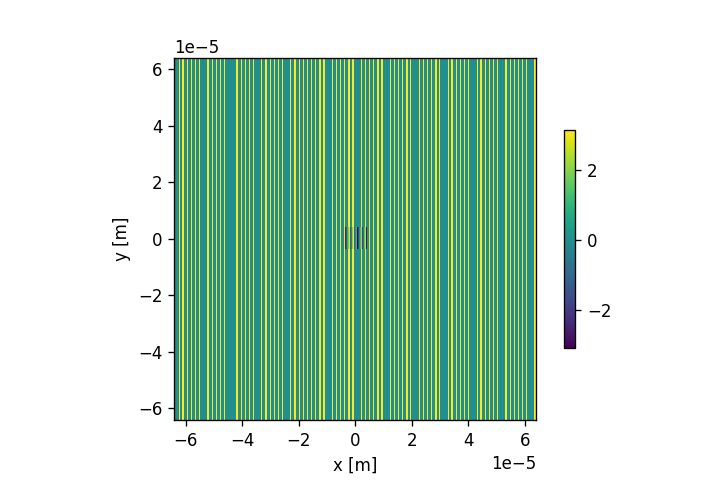

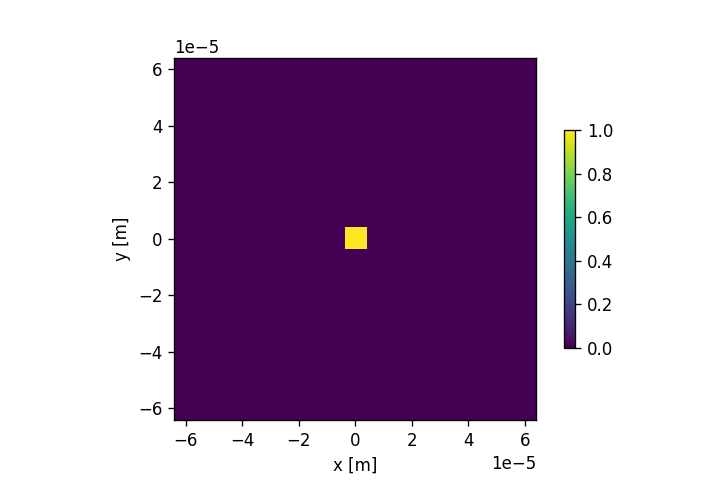

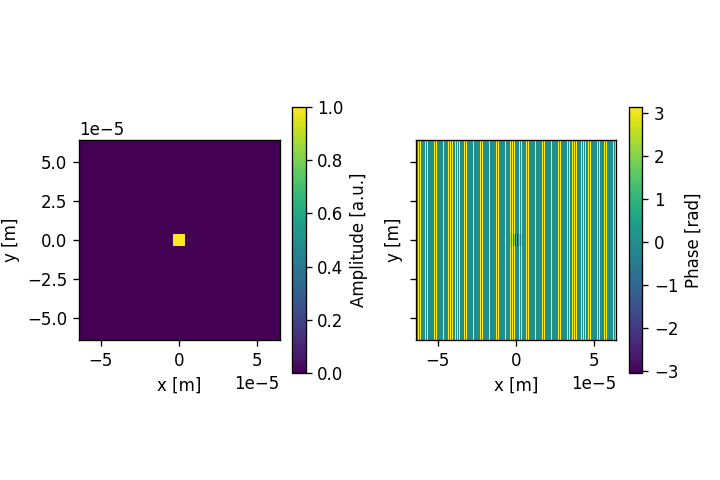

Elapsed: 0:00:00.481820
(1024, 1024)
(1024, 1024)
(533, 533)
Elapsed: 0:00:02.058581


Text(0.5, 1.0, 'SASM')

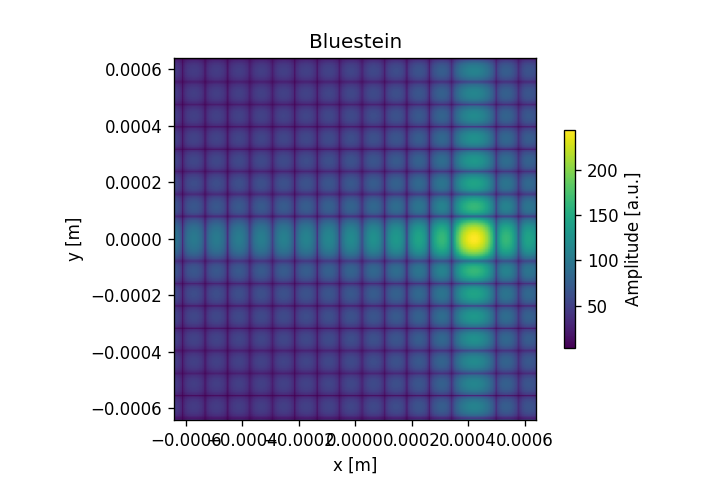

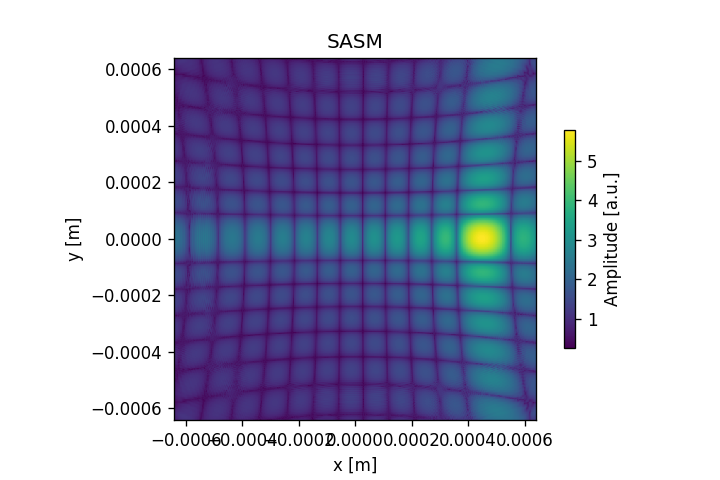

In [16]:

wavelength = 500e-9 #m
N_box =512 
M_box =8
L_box = 128e-6 #um 

D_box = L_box / 16

z_box =  M_box / N_box / wavelength * L_box**2 * 2 #m
 
pixsize = L_box / N_box
x_pixel = N_box
y_pixel = N_box
 
aperture_width  = x_pixel*pixsize
aperture_height = y_pixel*pixsize


y_box = np.linspace(-L_box/2, L_box/2, N_box, endpoint=False)
x_box = y_box 

XX, YY =np.meshgrid(x_box, y_box)
print(np.shape(XX))

U_box = ((XX)**2 <= (D_box / 2)**2) * (YY**2 <= (D_box / 2)**2) *\
        (np.exp(1j * 2 * np.pi / wavelength * XX * np.sin(20/ 360 * 2 * np.pi)))



# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Define Phase mask 
mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_phase.aperture = np.angle(U_box)

mask_amplitude = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_amplitude.aperture = np.abs(U_box)

# Plot the circular mask
moe.plotting.plot_aperture(mask_phase)

moe.plotting.plot_aperture(mask_amplitude)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(mask_phase)

# Generate a uniform field
field = moe.field.generate_uniform_field(field, E0=1)


# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=mask_amplitude, phase_mask=mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()



###Propagate field and calculate in plane YZ, using npix bins in Y
zmin = wavelength*2
zmax = 1.2*z_box
nzs = 2

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2*10, aperture_height/2*10
xmin, xmax = -aperture_height/2*10, aperture_height/2*10

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)

screen = moe.field.Screen(x,y,z)

# Propagate the field with Bluestein 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)


Exy = moe.field.Screen(x,y,z_box)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(z_box/zmax*nzs)], np.shape(Exy.screen[:, :, :]))

Exy.screen = (np.abs(0.0 + Exy.screen)**2)**0.13

moe.plotting.plot_screen_XY(Exy, which='amplitude')
plt.title("Bluestein")


# Propagate the field with SASM
EXYZ = moe.propagate.SASM(field, screen, wavelength, pad_factor=2, crop=True)


Exy = moe.field.Screen(x,y,z_box)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(z_box/zmax*nzs)], np.shape(Exy.screen[:, :, :]))

Exy.screen = (np.abs(0.0 + Exy.screen)**2)**0.13

moe.plotting.plot_screen_XY(Exy, which='amplitude')
plt.title("SASM")


(512, 512)


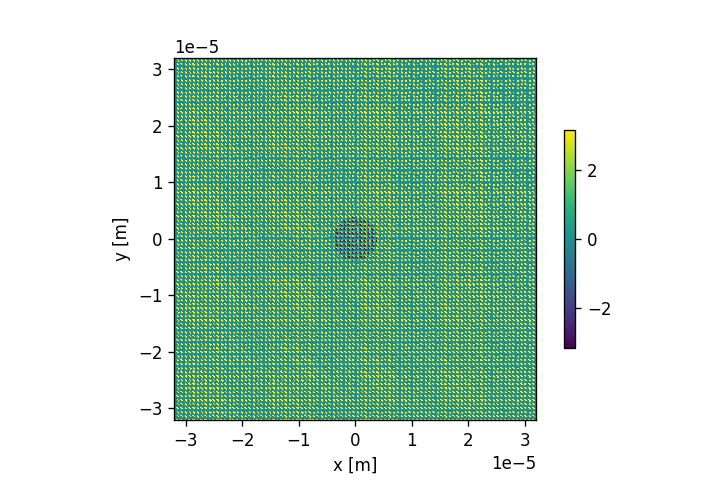

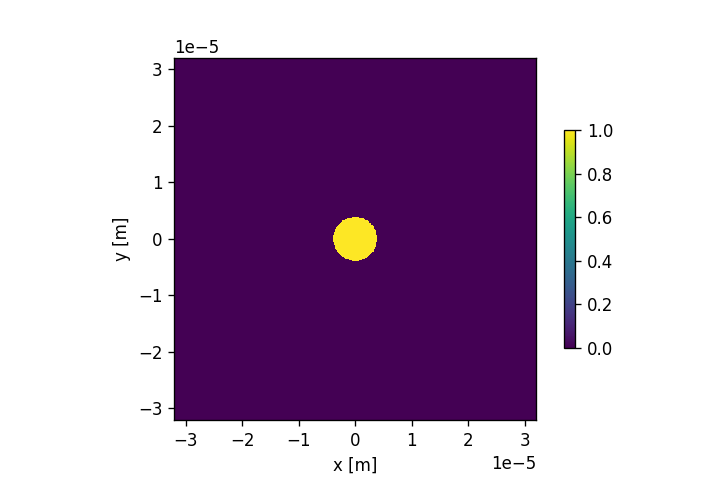

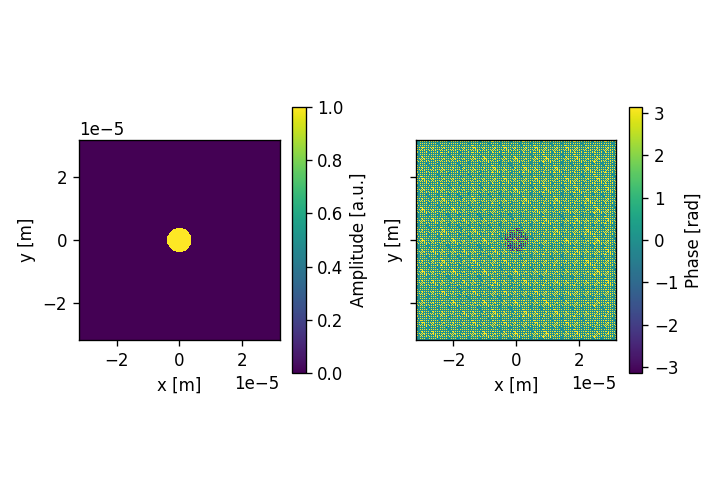

Elapsed: 0:00:00.605093
(1024, 1024)
(1024, 1024)
(511, 511)
Elapsed: 0:00:02.611200


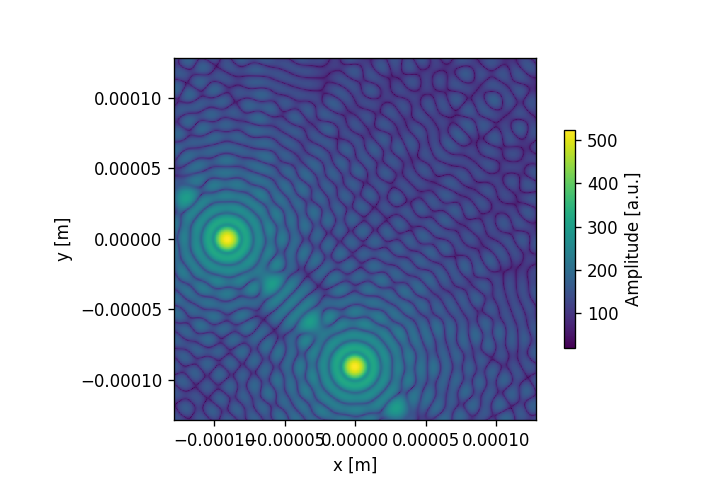

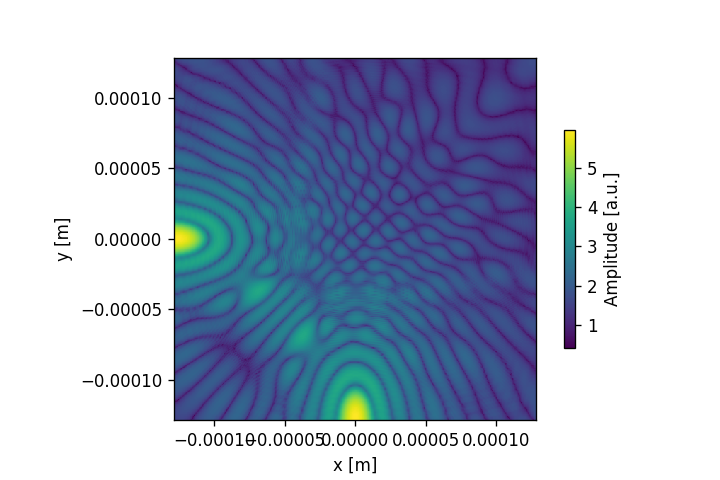

In [17]:
# Make circular apertures (returns also the 2D array)

wavelength = 500e-9 #m
N_box =512
M_box =4
L_box = 64e-6 #um 

D_box = L_box / 8

z_box =  128e-6 #M_box / N_box / wavelength * L_box**2 * 2 #m
 
pixsize = L_box / N_box
x_pixel = N_box
y_pixel = N_box
 
aperture_width  = x_pixel*pixsize
aperture_height = y_pixel*pixsize


y_box = np.linspace(-L_box/2, L_box/2, N_box)
x_box = y_box 

XX, YY =np.meshgrid(x_box, y_box)
print(np.shape(XX))


# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)


mask_amplitude = moe.generate.create_empty_aperture_from_aperture(aperture)

# Populate Aperture from phase mask 
mask_amplitude = moe.generate.circular_aperture(aperture, radius=D_box/2-pixsize)


U_box = (((XX/D_box)**2 + (YY/D_box)**2 ) <= ( 1/ 2)**2) *\
        (np.exp(1j * 2 * np.pi / wavelength * YY * np.sin(-45/ 360 * 2 * np.pi)) + \
         np.exp(1j * 2 * np.pi / wavelength * XX * np.sin(-45/ 360 * 2 * np.pi)) )

U_box = mask_amplitude.aperture *\
        (np.exp(1j * 2 * np.pi / wavelength * YY * np.sin(-45/ 360 * 2 * np.pi)) + \
         np.exp(1j * 2 * np.pi / wavelength * XX * np.sin(-45/ 360 * 2 * np.pi)) )


# Define Phase mask 
mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_phase.aperture =  np.angle(U_box)##np.abs(U_box)*np.pi


# Plot the circular mask
moe.plotting.plot_aperture(mask_phase)

moe.plotting.plot_aperture(mask_amplitude)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(mask_phase)

# Generate a uniform field
field = moe.field.generate_uniform_field(field, E0=1)


# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=mask_amplitude, phase_mask=mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()



###Propagate field and calculate in plane YZ, using npix bins in Y
zmin = wavelength*2
zmax = 1*z_box
nzs = 2

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2*4, aperture_height/2*4
xmin, xmax = -aperture_height/2*4, aperture_height/2*4

#ymin, ymax = -4, 4 
#xmin, xmax = ymin, ymax 

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)

screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Exy = moe.field.Screen(x,y,z_box)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(z_box/zmax*nzs-1)], np.shape(Exy.screen[:, :, :]))

Exy.screen = (np.abs(0.0 + Exy.screen)**2)**0.13

moe.plotting.plot_screen_XY(Exy, which='amplitude')


# Propagate the field 
#EXYZ = moe.propagate.Bluestein(field, screen, wavelength)
EXYZ = moe.propagate.SASM(field, screen, wavelength, pad_factor=2, crop=True)

Exy = moe.field.Screen(x,y,z_box)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(z_box/zmax*nzs-1)], np.shape(Exy.screen[:, :, :]))

Exy.screen = (np.abs(0.0 + Exy.screen)**2)**0.13

moe.plotting.plot_screen_XY(Exy, which='amplitude')



## Propagation from Computer Generated Holograms 

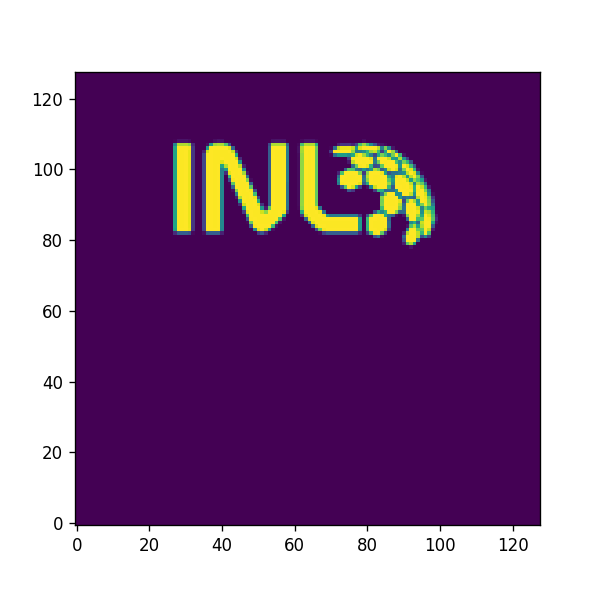

In [18]:
from PIL import Image, ImageOps
file = "../5 - Holograms/target.png"

target = Image.open(file).convert("L")
target = ImageOps.flip(target)

size = 128
target = target.resize((size,size))
target = np.array(target)/255

fig = plt.figure(figsize=(5,5))
x = np.arange(0,size)
y = np.arange(0,size)
plt.pcolormesh(x,y,target)

Progress: [####################] 100.0%
[Gerchberg Saxton Algorithm]
Elapsed: 0:00:00.132021


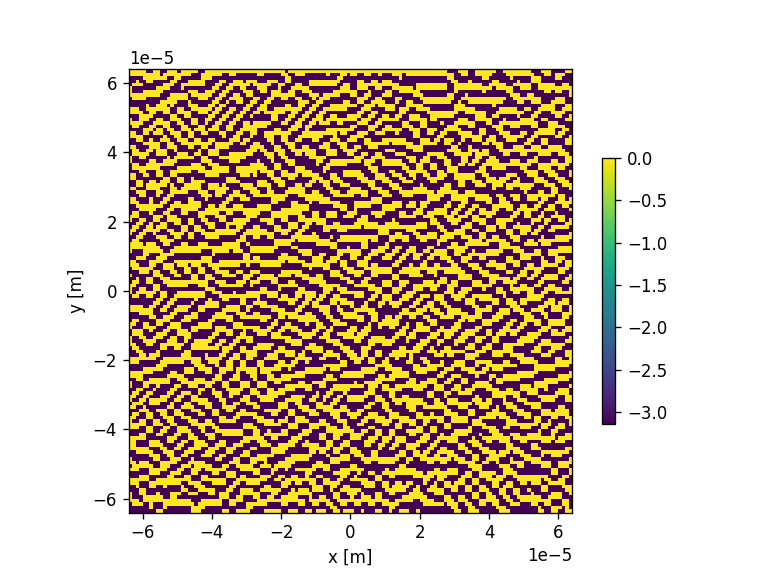

In [30]:
# Binary level phase mask
levels = 2

iterations = 20

levels = moe.utils.create_levels(-np.pi, np.pi, levels,)
phase_mask, errors = moe.holograms.algorithm_Gerchberg_Saxton(target, iterations=iterations, levels=levels)

phase_mask = moe.holograms.correct_mask_shift(phase_mask)
mask = moe.generate.create_aperture_from_array(phase_mask, pixel_size=(1*micro, 1*micro), center=True, )


# Discretize to same levels as original
mask.discretize(levels)
moe.plotting.plot_aperture(mask)

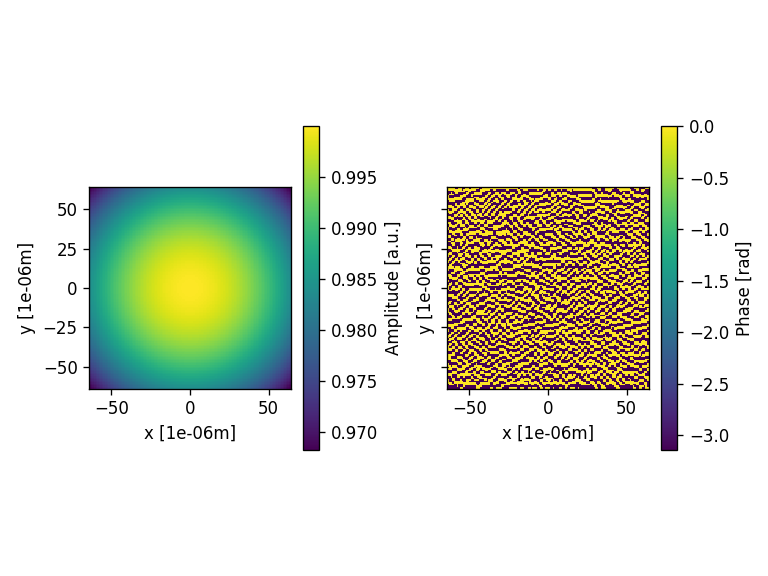

In [31]:
# Create the gaussian field to propagate through the hologram

field = moe.field.create_empty_field_from_aperture(mask)
field = moe.field.generate_gaussian_field(field, E0=1, w0=500*micro)
# field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=None)
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask)

moe.plotting.plot_field(field, scale=micro)
plt.tight_layout()

[########################################] | 100% Completed | 140.34 s


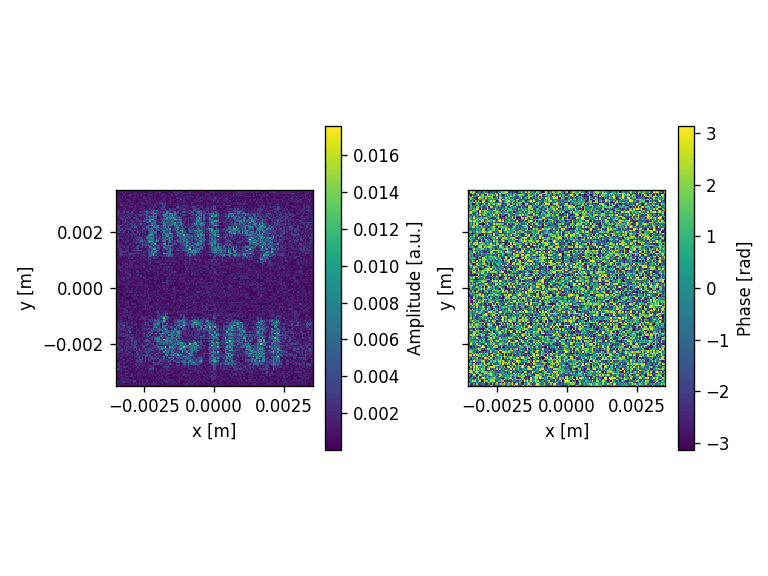

In [32]:
# define the wavelength used in the propagation
wavelength = 532*nano

# Define the screen size and create it
screen_width = 7000*micro
screen_height = 7000*micro
x_pixel = 128
y_pixel = 128

screen_XY = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
                                     -screen_height/2, screen_height/2, y_pixel, 
                                     z=15000*micro)

screen_XY = moe.propagate.RS_integral(field, screen_XY, wavelength)

moe.plotting.plot_screen_XY(screen_XY)
plt.tight_layout()

Elapsed: 0:00:00.009005


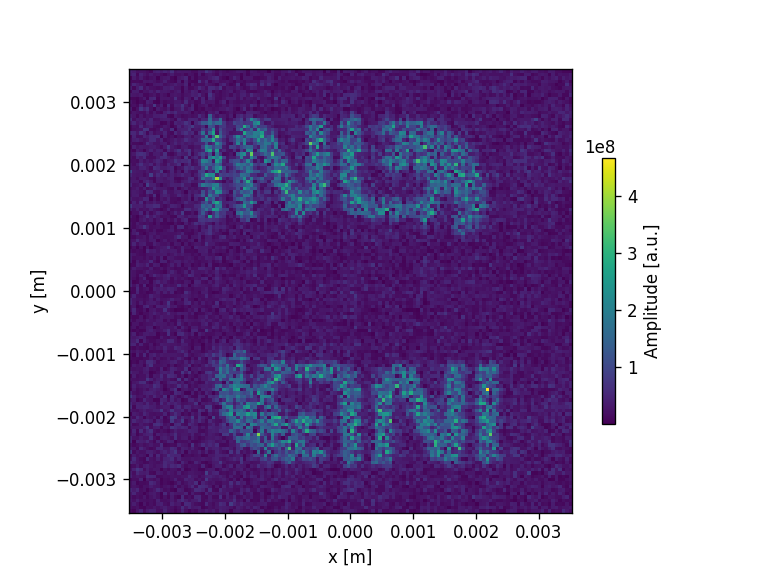

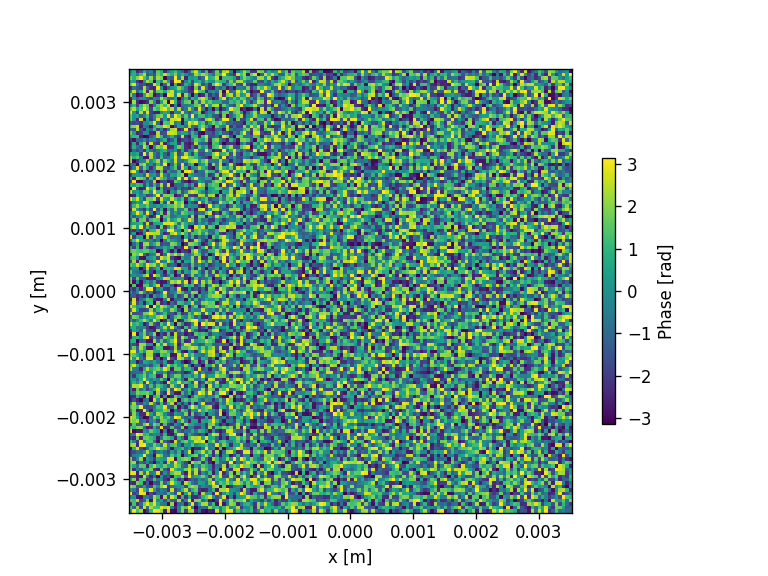

In [22]:
x = np.linspace(-screen_width/2, screen_width/2, x_pixel) 
y = np.linspace(-screen_height/2, screen_height/2, y_pixel,)
z = [15000*micro]

screen = moe.field.Screen(x,y,z)

#screen_XY3 = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
#                                     -screen_height/2, screen_height/2, y_pixel, 
#                                     z=15000*micro)

E_XY3 = moe.propagate.Bluestein(field, screen, wavelength)

moe.plotting.plot_screen_XY(E_XY3, which='amplitude')
moe.plotting.plot_screen_XY(E_XY3, which='phase')

Progress: [####################] 100.0%
[Gerchberg Saxton Algorithm]
Elapsed: 0:00:00.149920


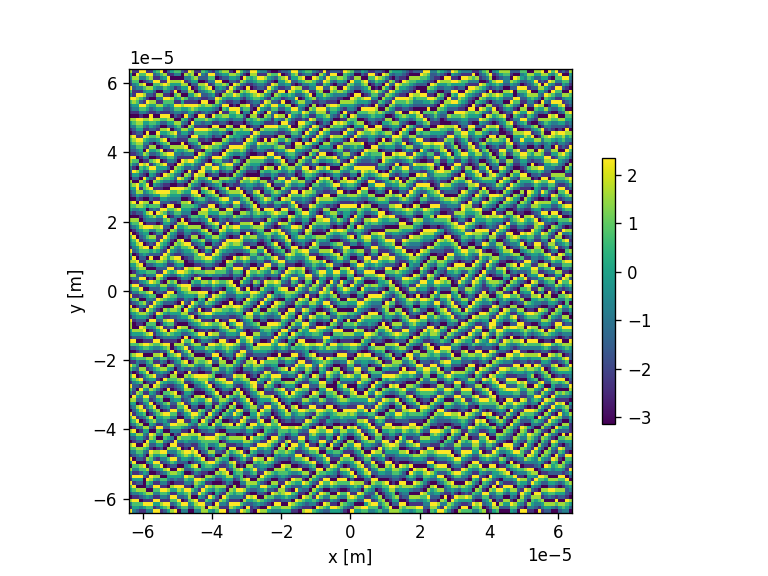

[########################################] | 100% Completed | 119.15 s


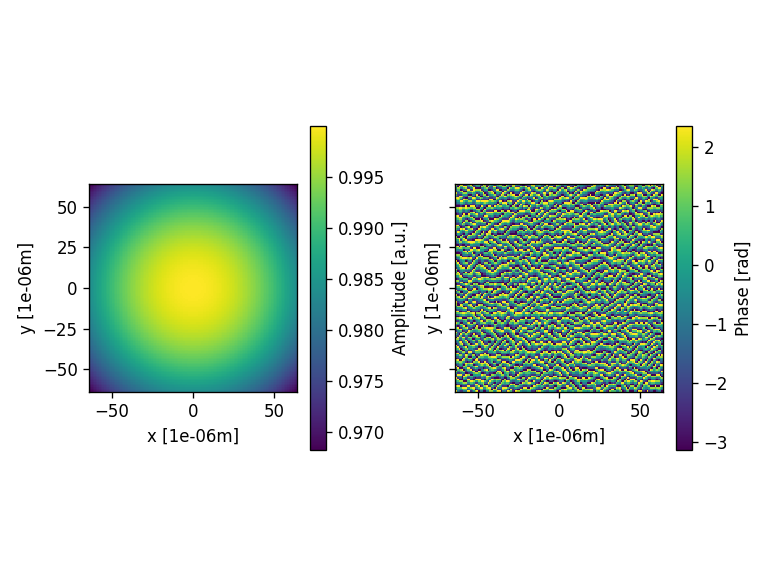

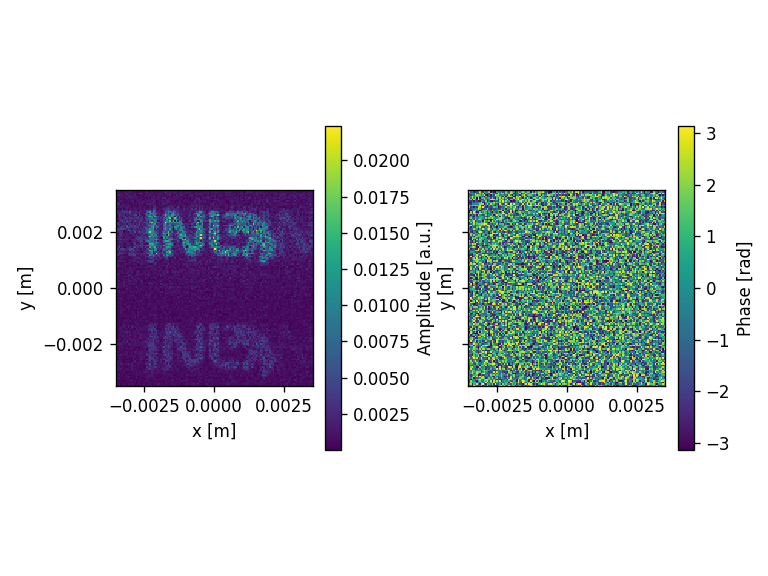

In [62]:
# Multilevel phase hologram
levels = 8

iterations = 20

levels = moe.utils.create_levels(-np.pi, np.pi, levels,)
phase_mask, errors = moe.holograms.algorithm_Gerchberg_Saxton(target, iterations=iterations, levels=levels)

phase_mask = moe.holograms.correct_mask_shift(phase_mask)
mask = moe.generate.create_aperture_from_array(phase_mask, pixel_size=(1*micro, 1*micro), center=True, )


# Discretize to same levels as original
mask.discretize(levels)
moe.plotting.plot_aperture(mask)

# Create the gaussian field to propagate through the hologram
field = moe.field.create_empty_field_from_aperture(mask)
field = moe.field.generate_gaussian_field(field, E0=1, w0=500*micro)
# field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=None)
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=mask)


moe.plotting.plot_field(field, scale=micro)
plt.tight_layout()



# define the wavelength used in the propagation
wavelength = 532*nano

# Define the screen size and create it
screen_width = 7000*micro
screen_height = 7000*micro
x_pixel = 128
y_pixel = 128

screen_XY = moe.field.create_screen_XY(-screen_width/2, screen_width/2, x_pixel,
                                     -screen_height/2, screen_height/2, y_pixel, 
                                     z=15000*micro)

screen_XY = moe.propagate.RS_integral(field, screen_XY, wavelength)

moe.plotting.plot_screen_XY(screen_XY)
plt.tight_layout()

## Near Field: Nanojet generation from a circular aperture illuminated by a Gaussian Beam

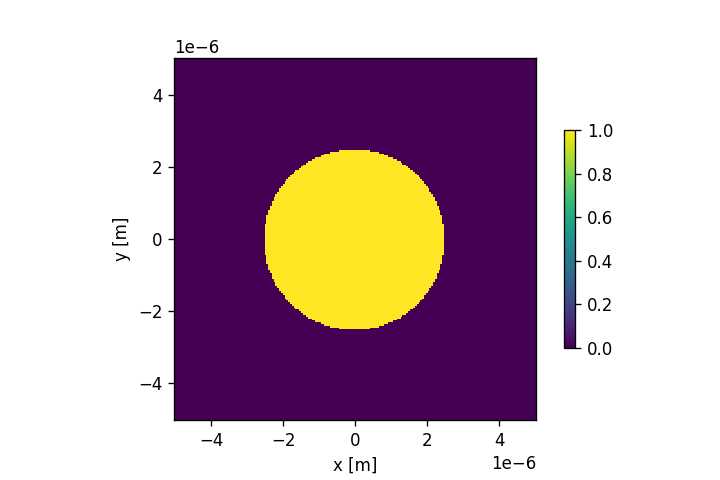

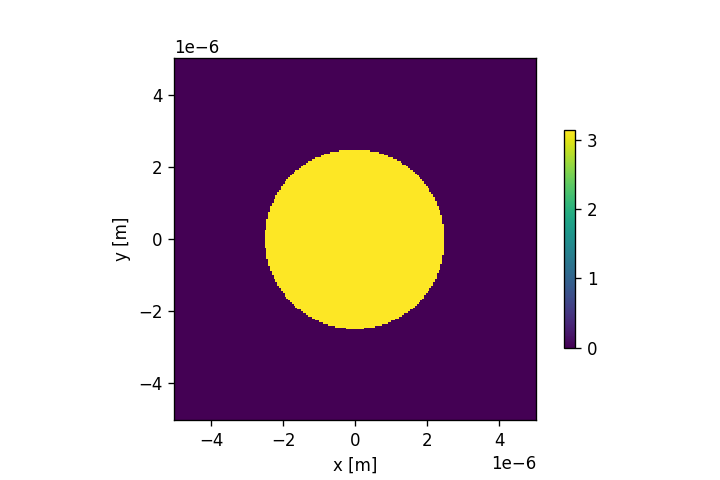

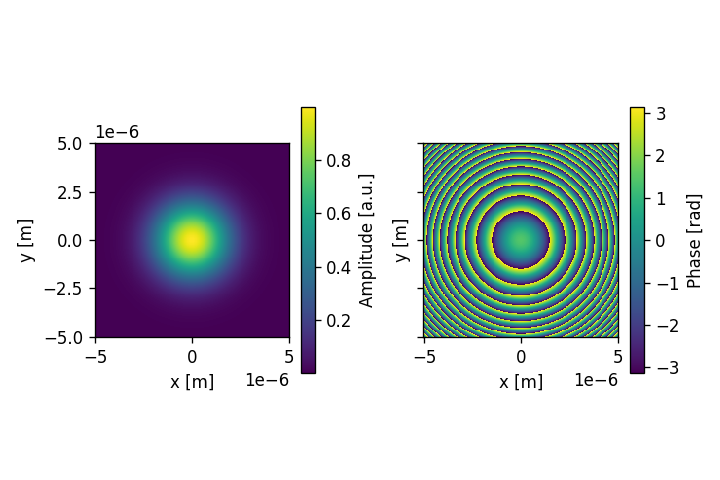

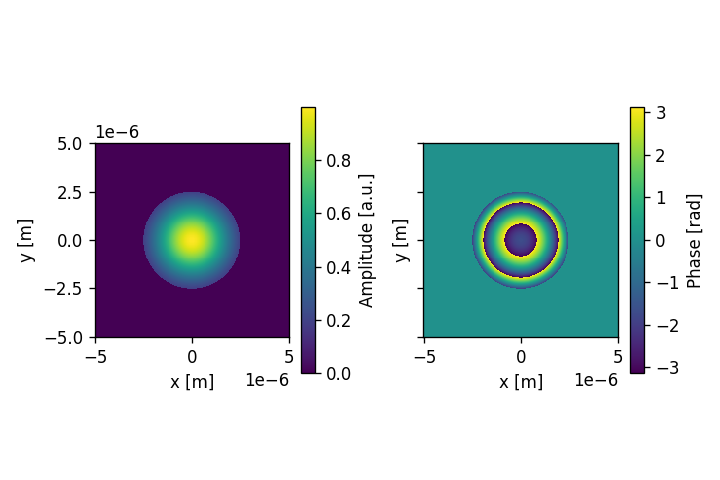

In [3]:
wavelength = 500e-9 #m
zdist = 100*wavelength #m
 
x_pixel = 200
y_pixel = 200

radius = 2.5e-6 #m 
 
aperture_width  = 4*radius
aperture_height = 4*radius

d = -3e-6 #displacement of the waist of the Gaussian beam 

center = (-(aperture_width/x_pixel)/2, -(aperture_height/y_pixel)/2)

# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture from phase mask 
mask = moe.generate.circular_aperture(aperture, radius=radius, center =center )

# Define Phase mask 
mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_phase.aperture = mask.aperture*np.pi

mask_phase.aperture[mask_phase.XX**2 + mask_phase.YY**2 > radius**2] = 0


# Plot the circular mask
moe.plotting.plot_aperture(mask)

moe.plotting.plot_aperture(mask_phase)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(mask)


field = moe.field.generate_gaussian_beam(field, 0.5*wavelength, d, wavelength)


# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=mask_phase)

field.field[mask_phase.XX**2 + mask_phase.YY**2 > radius**2] = 0

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

[########################################] | 100% Completed |  7min 55.4s


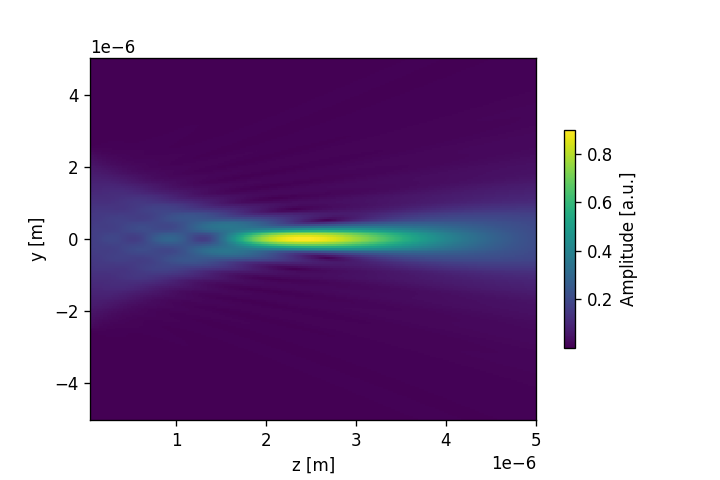

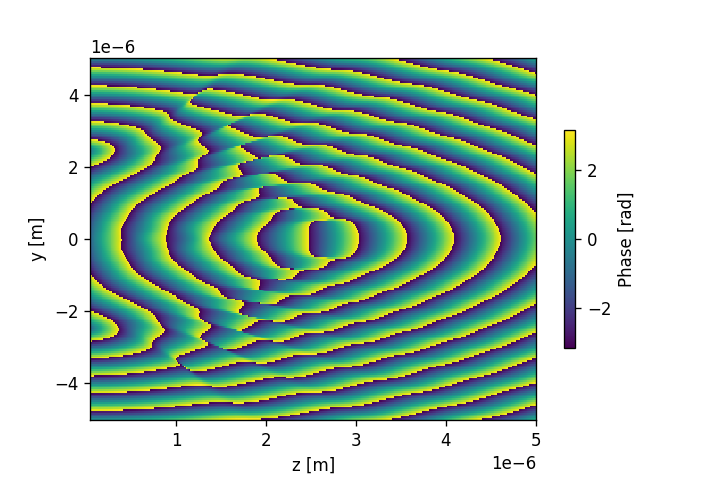

In [4]:
zmin = 0.1*wavelength
zmax = 5e-6
nzs = 500

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax]
screen_YZ1 = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, y_pixel, 
                                        zmin, zmax, nzs,
                                        x=0)


# Propagate the field 
E_YZ = moe.propagate.RS_integral(field, screen_YZ1,  wavelength, simp2d=True)

#Plot the amplitude of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='amplitude')
plt.show()

#Plot the phase of the propagated field in yz screen
moe.plotting.plot_screen_YZ(E_YZ, which='phase')
plt.show()

In [10]:
#Propagate with Bluestein 

screen_YZ1 = moe.field.create_screen_YZ(-aperture_height/2, aperture_height/2, y_pixel, 
                                        zmin, zmax, nzs,
                                        x=[0])

E_XY3 = moe.propagate.Bluestein(field, screen_YZ1,  wavelength)

Elapsed: 0:00:09.309699


In [11]:
#moe.plotting.plot_screen_XY(E_XY3.screen[:,0,:], which='amplitude')
#moe.plotting.plot_screen_XY(E_XY3, which='phase')

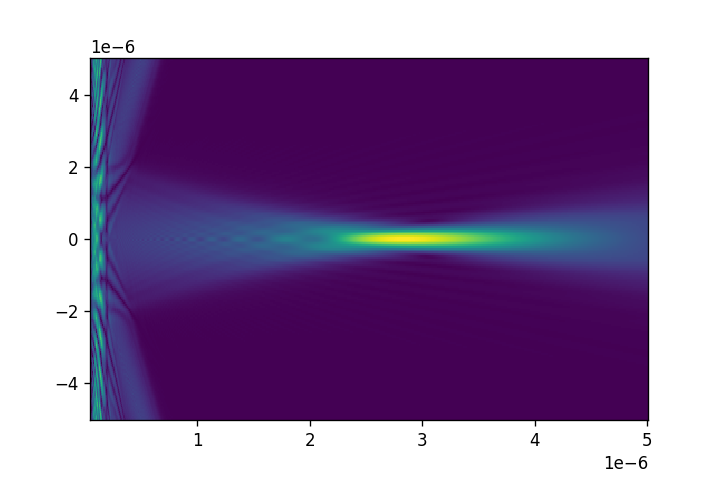

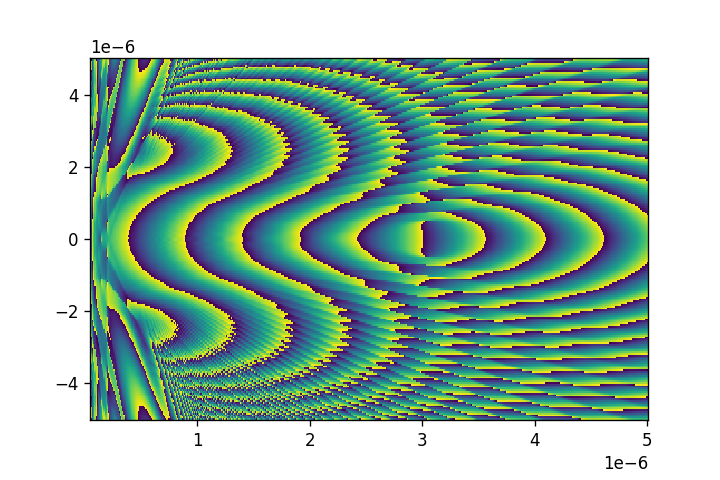

In [12]:
plt.figure()
plt.pcolormesh(E_XY3.z,E_XY3.y,np.abs(E_XY3.screen[:,0,:]) )
plt.figure()
plt.pcolormesh(E_XY3.z,E_XY3.y,np.angle(E_XY3.screen[:,0,:]) )

[########################################] | 100% Completed | 23.2s
[########################################] | 100% Completed | 24.1s
[########################################] | 100% Completed | 21.6s
3.944209461627281e-06
3.926990816987243e-05


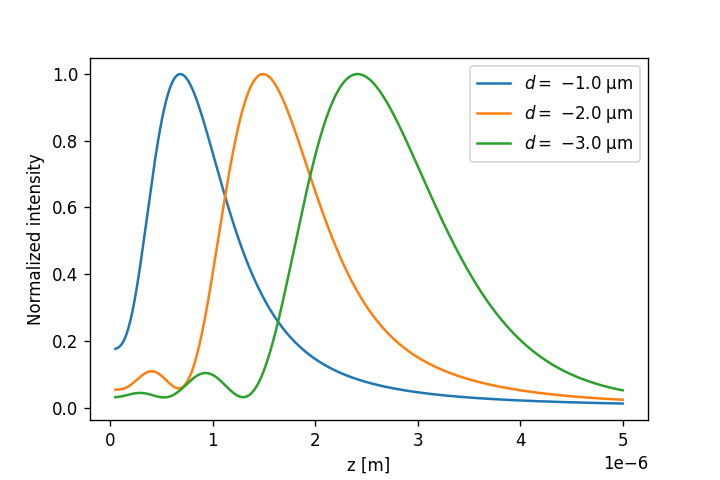

In [13]:
####Propagate the field from a circular aperture illuminated by a tightly focused Gaussian Beam 


wavelength = 500e-9 #m
zdist = 100*wavelength #m
k = 2*np.pi/(wavelength)

zmin = 0.1*wavelength
zmax = 5e-6
nzs = 500


x_pixel = 512
y_pixel = 512

radius = 2.5e-6 #m 

aperture_width  = 4*radius
aperture_height = 4*radius

center = (0, 0)

vals = np.zeros((3,nzs))

fig = plt.figure()

for ids, d in enumerate(np.array([-1e-6, -2e-6, -3e-6 ])):
    # Define Aperture
    aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

    # Populate Aperture from phase mask 
    mask = moe.generate.circular_aperture(aperture, radius=radius)

    # Define Phase mask 
    mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
    mask_phase.aperture = mask.aperture*np.pi

    # Initialize a Field from the Aperture mask 
    field = moe.field.create_empty_field_from_aperture(mask)

    field_gauss = moe.field.generate_gaussian_beam(field, 0.5*wavelength, d, wavelength)

    # Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
    field = moe.field.modulate_field(field_gauss, amplitude_mask=mask, phase_mask=mask_phase)
    
    field.field[mask_phase.XX**2 + mask_phase.YY**2 > radius**2] = 0

    screen_ZZ = moe.field.create_screen_ZZ(zmin, zmax, nzs)
    E_ZZ = moe.propagate.RS_integral(field, screen_ZZ, wavelength, parallel_computing=True)

    vals[ids] = np.abs(E_ZZ.amplitude[0,0,:])**2/np.max(np.abs(E_ZZ.amplitude[0,0,:])**2)

    plt.plot(np.linspace(zmin,zmax,nzs), np.abs(E_ZZ.amplitude[0,0,:])**2/np.max(np.abs(E_ZZ.amplitude[0,0,:])**2),\
            label="$d = $ $"+str(d*1e6)+"$ $\mathrm{\mu m}$" )
    
###Print the distances for the two criteria 
print(moe.propagate.Fresnel_criterion(wavelength, radius))
print(moe.propagate.Fraunhofer_criterion(wavelength, radius))
    
plt.legend()
plt.xlabel("z [m]")
plt.ylabel("Normalized intensity")
plt.show()

## Oblique Incidence

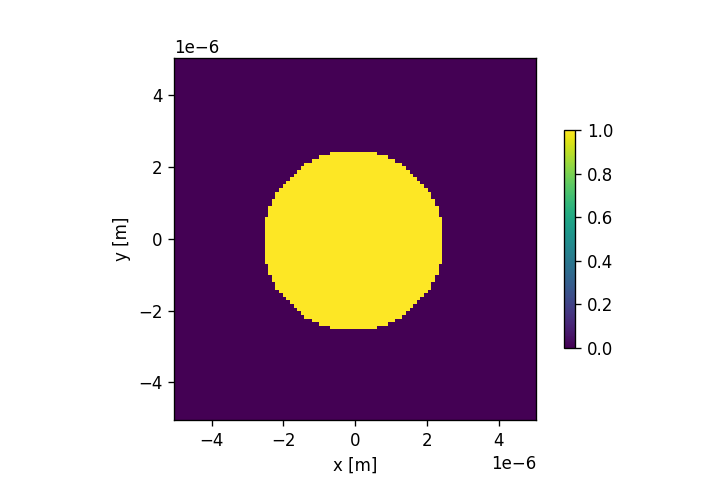

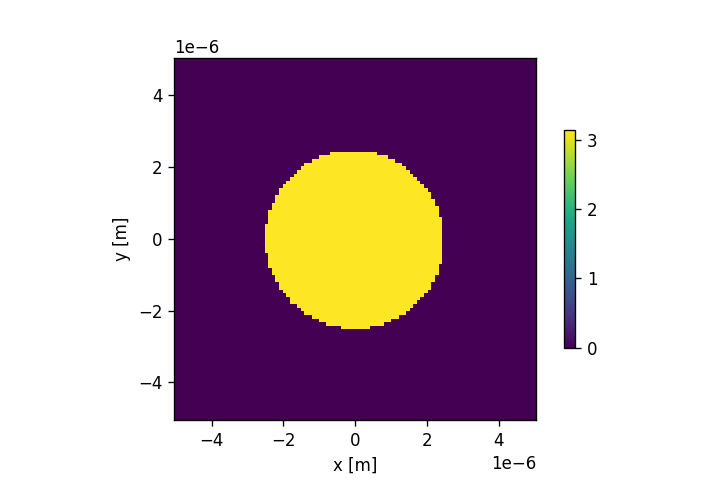

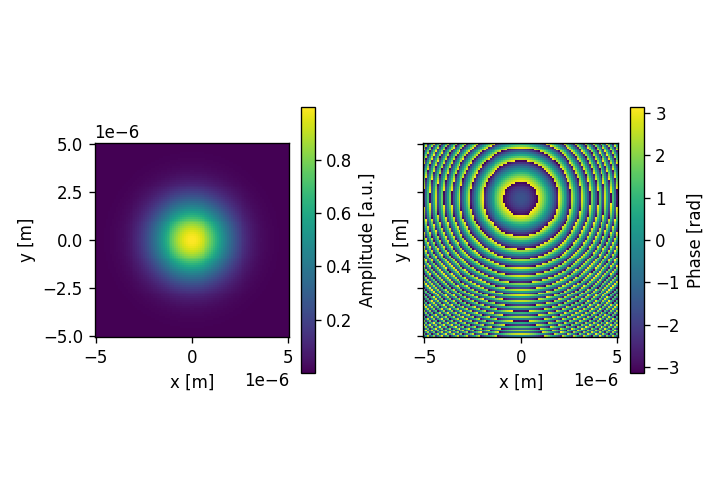

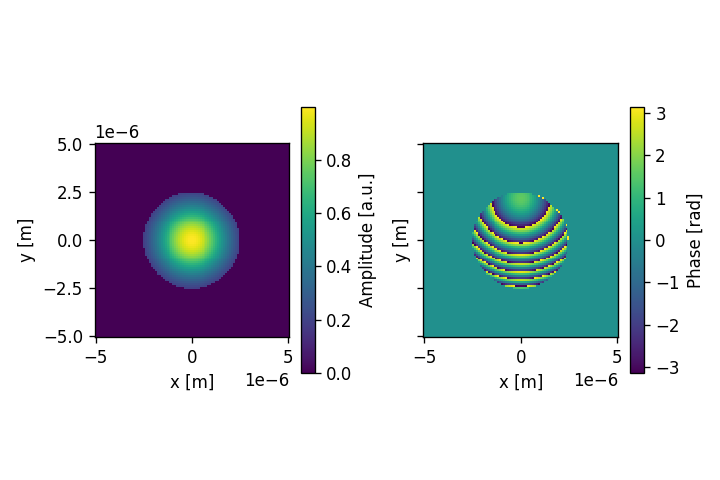

In [14]:
###let's use previous example to demonstrate how to handle oblique incidence 

wavelength = 500e-9 #m
zdist = 100*wavelength #m
 
x_pixel = 100
y_pixel = 100

radius = 2.5e-6 #m 
 
aperture_width  = 4*radius
aperture_height = 4*radius

d = -3e-6 #displacement of the waist of the Gaussian beam 

center = (-(aperture_width/x_pixel)/2, -(aperture_height/y_pixel)/2)

# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)

# Populate Aperture from phase mask 
mask = moe.generate.circular_aperture(aperture, radius=1*radius, center =center )

# Define Phase mask 
mask_phase = moe.generate.create_empty_aperture_from_aperture(aperture)
mask_phase.aperture = mask.aperture*np.pi

mask_phase.aperture[mask_phase.XX**2 + mask_phase.YY**2 > (1*radius)**2] = 0


# Plot the circular mask
moe.plotting.plot_aperture(mask)

moe.plotting.plot_aperture(mask_phase)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(mask)


field = moe.field.generate_gaussian_beam(field, 0.5*wavelength, d, wavelength)


#Oblique incidence angles 
thetax = 0
thetay = np.pi/4

#calculate the oblique field at the aperture plane 
field = moe.field.oblique(field, wavelength, thetax, thetay)


# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=mask, phase_mask=mask_phase)

field.field[mask_phase.XX**2 + mask_phase.YY**2 > (1*radius)**2] = 0

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

[########################################] | 100% Completed | 23.6s


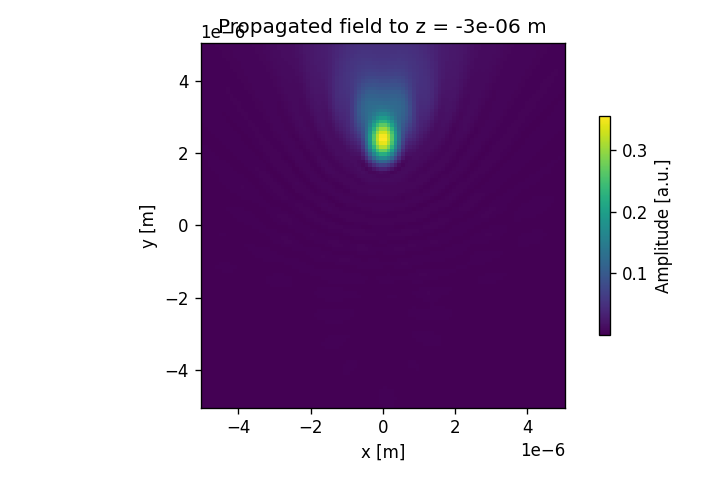

In [15]:

##Propagate field in plane XY at z_distance

z_distance = d

# Creates XY screen
screen_XY = moe.field.create_screen_XY(-aperture_width/2, aperture_width/2, x_pixel, 
                                       -aperture_height/2, aperture_height/2, y_pixel, 
                                        z=z_distance)

# Propagate the field
E_XY = moe.propagate.RS_integral(field, screen_XY, wavelength, simp2d=True)

moe.plotting.plot_screen_XY(E_XY, which='amplitude')
plt.title("Propagated field to z = "+str(z_distance)+" m")

plt.tight_layout()
plt.show()


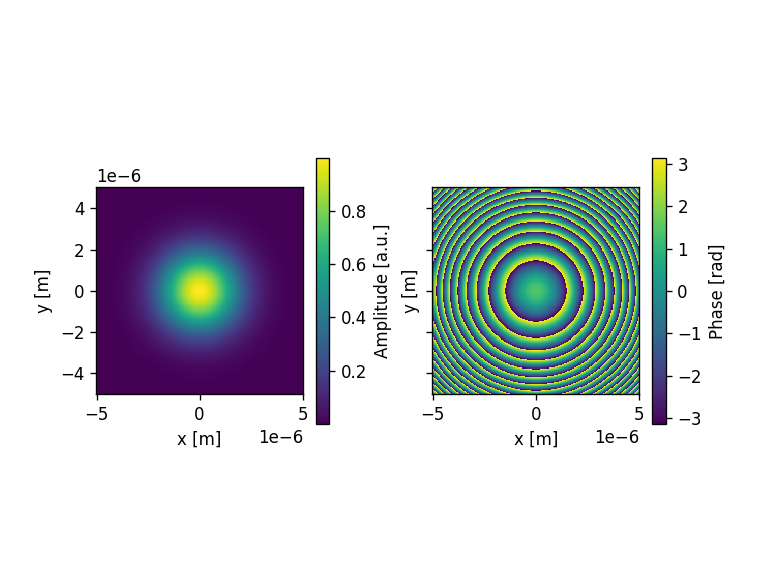

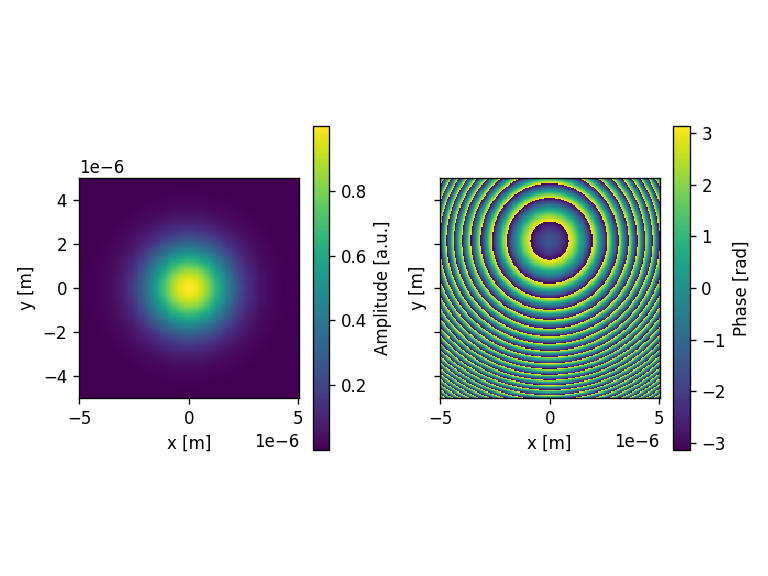

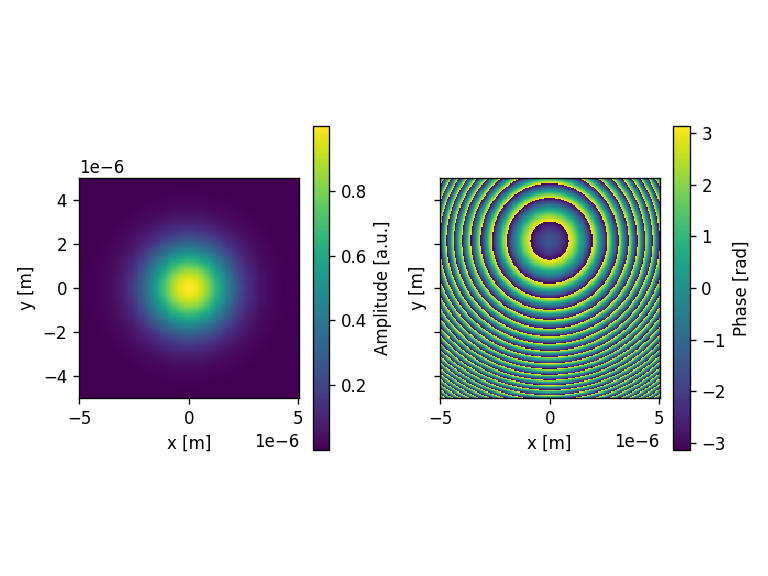

Elapsed: 0:00:02.623454


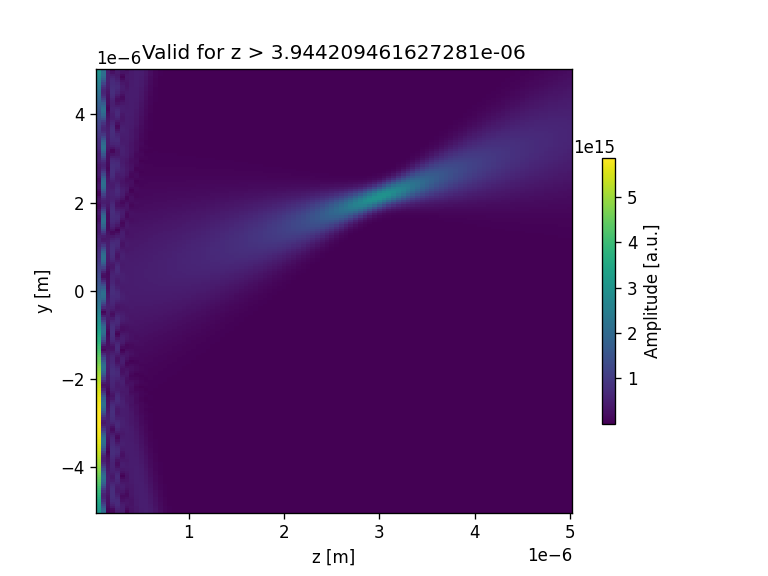

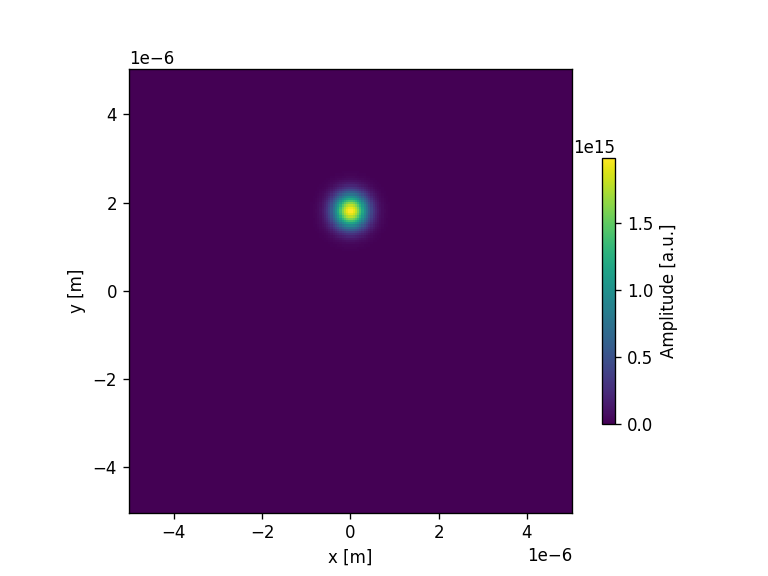

In [5]:
#Simple oblique propagate in YZ 

wavelength = 500e-9 #m
zdist = 100*wavelength #m
 
x_pixel = 200
y_pixel = 200

radius = 2.5e-6 #m 
 
aperture_width  = 4*radius
aperture_height = 4*radius

d = -3e-6 #displacement of the waist of the Gaussian beam 

center = (-(aperture_width/x_pixel)/2, -(aperture_height/y_pixel)/2)

# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(aperture)


field = moe.field.generate_gaussian_beam(field, 0.5*wavelength, d, wavelength)

moe.plotting.plot_field(field)

field = moe.field.oblique(field, wavelength, 0, np.pi/4)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=None)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


###Propagate field and calculate in plane YZ, using npix bins in Y
zmin = 0.1*wavelength
zmax = 5e-6
nzs = 100

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2, aperture_height/2
xmin, xmax = -aperture_height/2, aperture_height/2

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)

screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Eyz = moe.field.Screen(0,y,z)
Eyz.screen = np.reshape(EXYZ.screen[:,int(y_pixel/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
#plt.vlines(limitx, -radius, radius, colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Exy = moe.field.Screen(x,y,2.5e-6)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(2.5e-6/zmax*nzs)], np.shape(Exy.screen[:, :, :]))


moe.plotting.plot_screen_XY(Exy, which='amplitude')


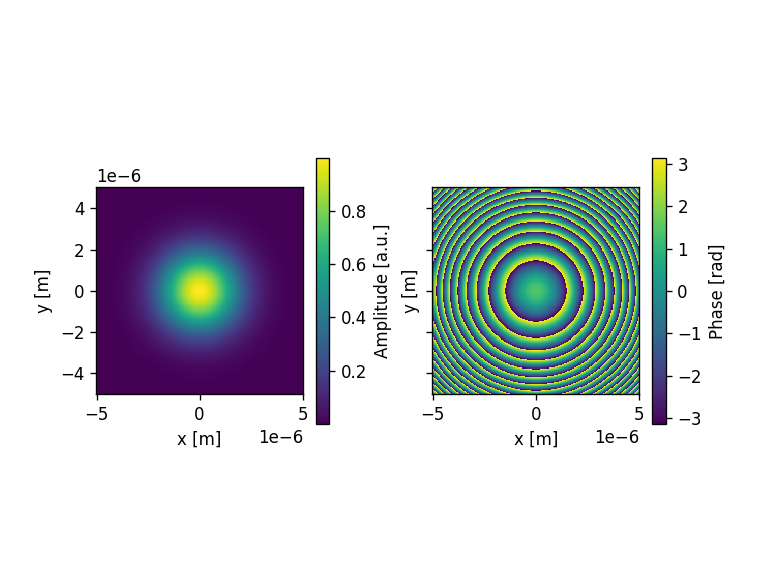

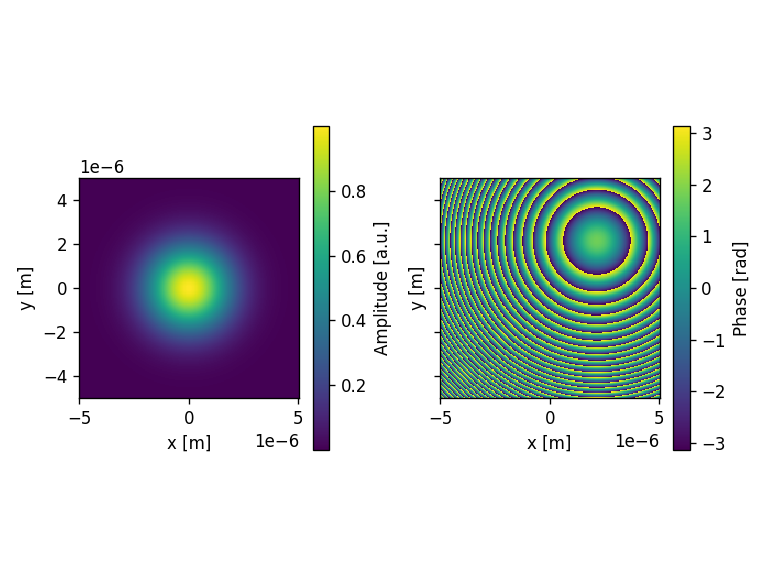

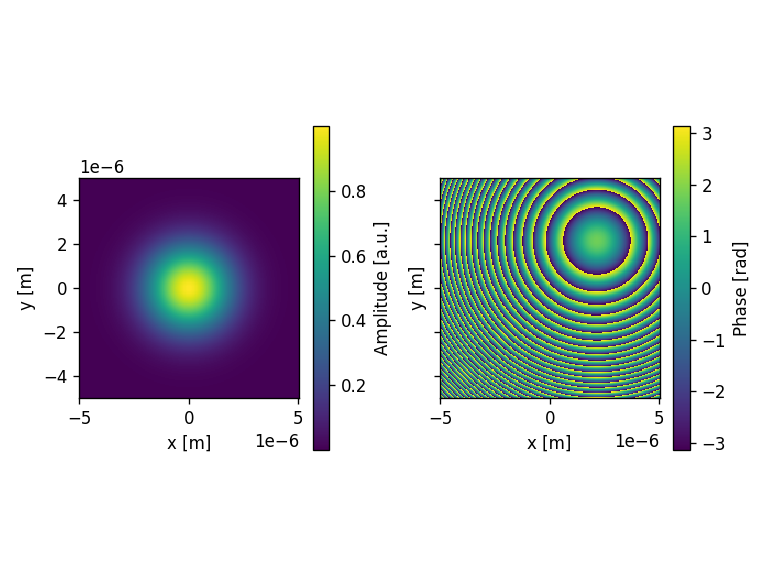

Elapsed: 0:00:02.556463


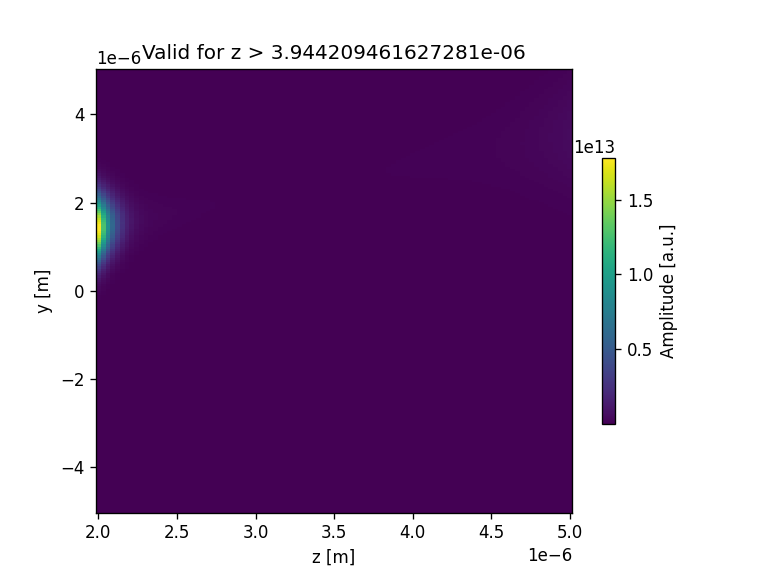

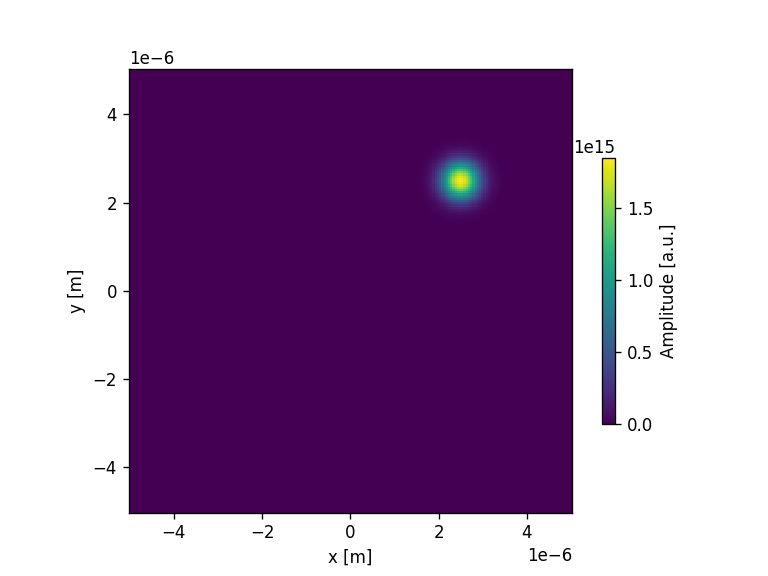

In [6]:
wavelength = 500e-9 #m
zdist = 100*wavelength #m
 
x_pixel = 200
y_pixel = 200

radius = 2.5e-6 #m 
 
aperture_width  = 4*radius
aperture_height = 4*radius

d = -3e-6 #displacement of the waist of the Gaussian beam 

center = (-(aperture_width/x_pixel)/2, -(aperture_height/y_pixel)/2)

# Define Aperture
aperture = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)


# Calculates a field to use with the calculated mask

# Initialize a Field from the Aperture mask 
field = moe.field.create_empty_field_from_aperture(aperture)


field = moe.field.generate_gaussian_beam(field, 0.5*wavelength, d, wavelength)

moe.plotting.plot_field(field)

field = moe.field.oblique(field, wavelength, np.pi/4, np.pi/4)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field = moe.field.modulate_field(field, amplitude_mask=None, phase_mask=None)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field)

plt.tight_layout()
plt.show()


###Propagate field and calculate in plane YZ, using npix bins in Y
zmin = wavelength*4
zmax = 5e-6
nzs = 100

# Creates a screen in YZ plane with [-aperture_height/2, aperture_height/2] and [zmin, zmax] and 
ymin, ymax = -aperture_height/2, aperture_height/2
xmin, xmax = -aperture_height/2, aperture_height/2

x = np.linspace(xmin, xmax, x_pixel)
y = np.linspace(ymin, ymax, y_pixel)
z = np.linspace(zmin, zmax, nzs)

screen = moe.field.Screen(x,y,z)

# Propagate the field 
EXYZ = moe.propagate.Bluestein(field, screen, wavelength)

Eyz = moe.field.Screen(0,y,z)
Eyz.screen = np.reshape(EXYZ.screen[:,int(y_pixel/2), :], np.shape(Eyz.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,radius)
#plt.vlines(limitx, -radius, radius, colors='red', linestyles='dashed', lw=2)

plt.title("Valid for z > "+str(limitx))

plt.show()

Exy = moe.field.Screen(x,y,2.5e-6)
Exy.screen = np.reshape(EXYZ.screen[:,:, int(2.5e-6/zmax*nzs)], np.shape(Exy.screen[:, :, :]))


moe.plotting.plot_screen_XY(Exy, which='amplitude')


## To be updated: Propagation through two lens 

In [13]:
###Import two surfaces - doublet 
import numpy as np 

a1_phase = np.genfromtxt("asph1_phase.csv", delimiter=',')
a1_inten = np.genfromtxt("asph1_inten.csv", delimiter=',')

a2_phase = np.genfromtxt("asph2_phase.csv", delimiter=',')
a2_inten = np.genfromtxt("asph2_inten.csv", delimiter=',')

a1_phase.shape

(400, 400)

In [40]:
#number of pixels 
x_pixel, y_pixel = a1_phase.shape

#size of the rectangular mask 
aperture_width  = 0.2e-3 #m
aperture_height = 0.2e-3

pixsize = 0.5e-6 #m

wavelength = 700e-9 #m

dist1 = 0.1e-3 
dist2 = 0.4e-3

zmin1 = wavelength
zmax1 = dist1
nzs = 200

zmin2 = 0.1*wavelength
zmax2 = 1.2* dist2
nzs = 200


radius = aperture_width/2 

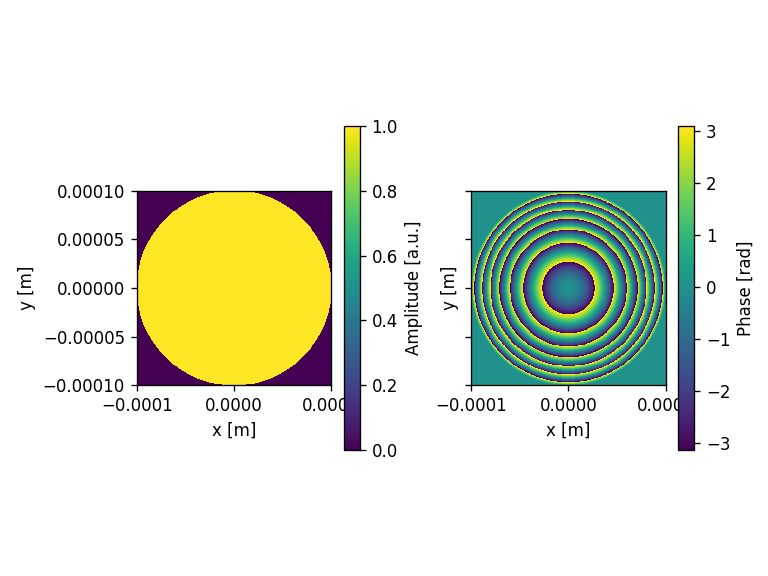

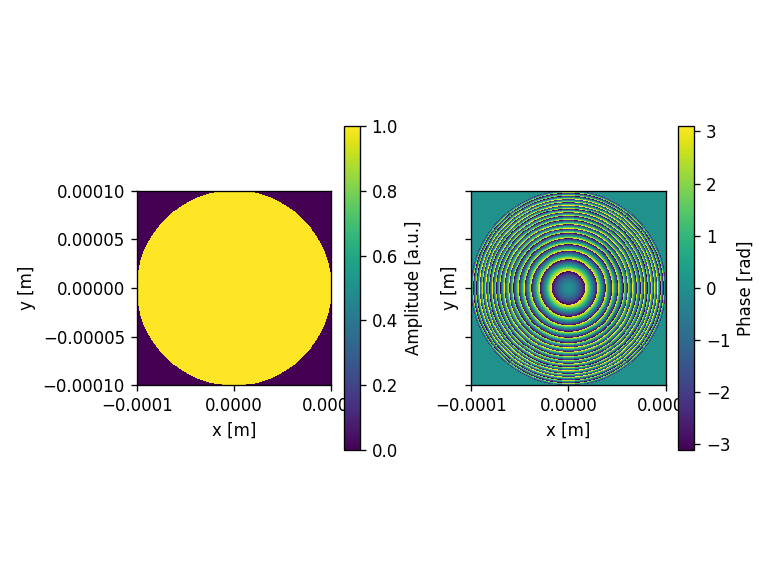

In [41]:
asph1_mask_phase = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)
asph1_mask_phase.aperture = a1_phase

asph1_mask_inten = moe.generate.create_empty_aperture_from_aperture(asph1_mask_phase)
asph1_mask_inten.aperture = a1_inten

# Initialize a Field from the Aperture mask 
field1 = moe.field.create_empty_field_from_aperture(asph1_mask_phase)

# Generate a uniform field
field1 = moe.field.generate_uniform_field(field1, E0=1)

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field1 = moe.field.modulate_field(field1, amplitude_mask = asph1_mask_inten, phase_mask=asph1_mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field1)

plt.tight_layout()
plt.show()


asph2_mask_phase = moe.generate.create_empty_aperture(-aperture_width/2, aperture_width/2, x_pixel, -aperture_height/2, aperture_height/2, y_pixel)
asph2_mask_phase.aperture = a2_phase

asph2_mask_inten = moe.generate.create_empty_aperture_from_aperture(asph2_mask_phase)
asph2_mask_inten.aperture = a2_inten

# Initialize a Field from the Aperture mask 
field2 = moe.field.create_empty_field_from_aperture(asph2_mask_phase)

# Generate a uniform field
field2 = moe.field.generate_uniform_field(field2, E0=1)

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field2 = moe.field.modulate_field(field2, amplitude_mask = asph2_mask_inten, phase_mask=asph2_mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field2)

plt.tight_layout()
plt.show()

In [42]:
x1 = asph1_mask_phase.x
y1 = asph1_mask_phase.y
z1 = np.linspace(zmin1, zmax1, nzs)

screen1 = moe.field.Screen(x1,y1,z1)

x2 = asph2_mask_phase.x
y2 = asph2_mask_phase.y
z2 = np.linspace(zmin2, zmax2, nzs)

screen2 = moe.field.Screen(x2,y2,z2)

In [43]:
# Propagate the field 
EXYZ1 = moe.propagate.Bluestein(field1, screen1, wavelength)

Elapsed: 0:00:30.151328


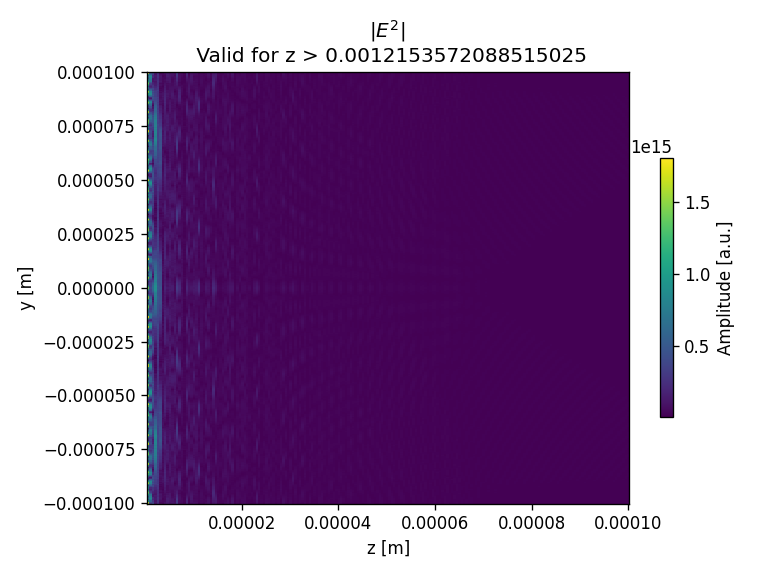

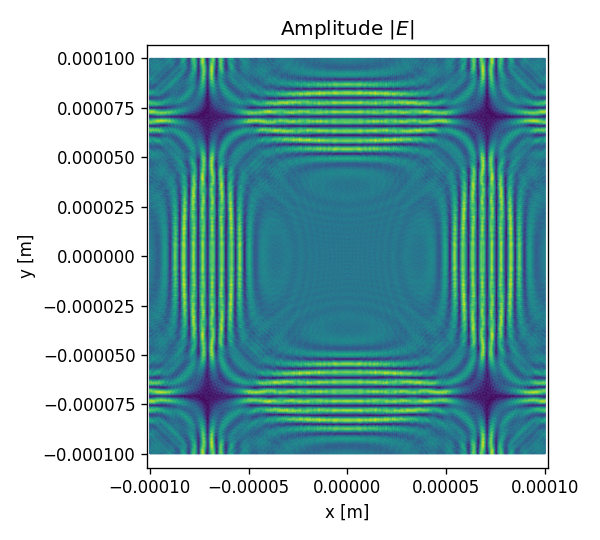

In [44]:
Eyz1 = moe.field.Screen(0,y1,z1)
Eyz1.screen = np.reshape(np.abs(EXYZ1.screen[:,int(y_pixel/2),:]), np.shape(Eyz1.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz1, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,aperture_width)
#plt.vlines(limitx, -aperture_width/2, aperture_width/2, colors='red', linestyles='dashed', lw=2)
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("|$E^2$| \n Valid for z > "+str(limitx))
plt.tight_layout()
plt.show()


Exy1 = moe.field.Screen(x1,y1,0)

fig = plt.figure(figsize=(5,4.5)) 
plt.pcolormesh(x1,y1, np.abs(EXYZ1.screen[:,:, -1]), shading='gouraud')
plt.title("Amplitude |$E$|")

plt.xlabel("x [m]")
plt.ylabel("y [m]")
plt.tight_layout()
plt.axis('equal')
plt.tight_layout()
plt.show()

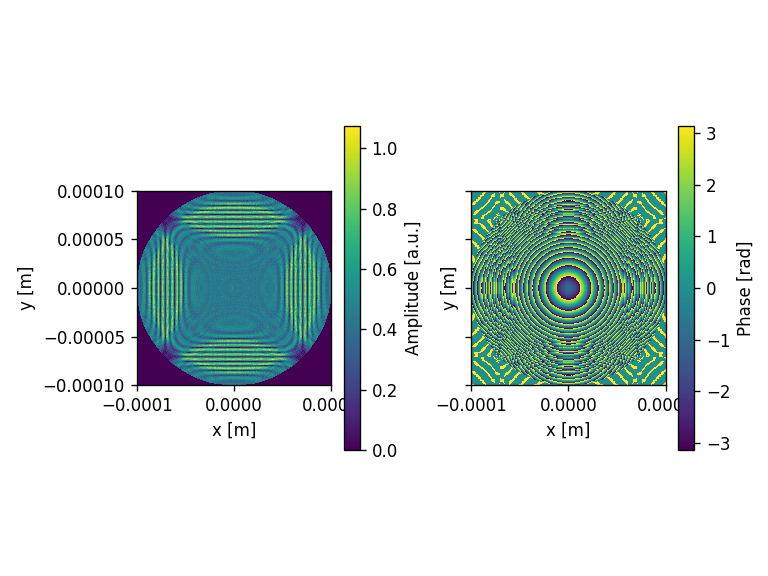

In [75]:
field2.field = EXYZ1.screen[:,:, -1]/np.max(EXYZ1.screen[:,:, -1])

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field2 = moe.field.modulate_field(field2, amplitude_mask = asph2_mask_inten, phase_mask=asph2_mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field2)

plt.tight_layout()
plt.show()

In [76]:
# Propagate the field 
EXYZ2 = moe.propagate.Bluestein(field2, screen2, wavelength)

Elapsed: 0:00:29.558797


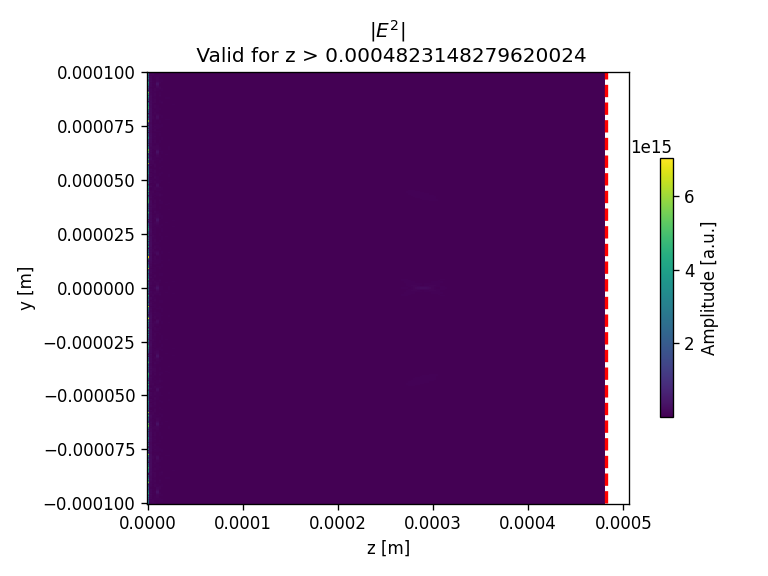

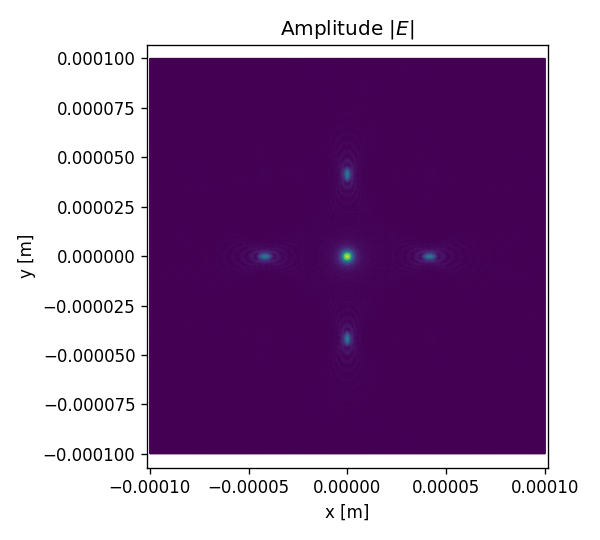

In [85]:
Eyz2 = moe.field.Screen(0,y2,z2)
Eyz2.screen = np.reshape(np.abs(EXYZ2.screen[:,int(y_pixel/2), :]), np.shape(Eyz2.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz2, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,aperture_width/2)
plt.vlines(limitx, -aperture_width/2, aperture_width/2, colors='red', linestyles='dashed', lw=2)
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("|$E^2$| \n Valid for z > "+str(limitx))
plt.tight_layout()
plt.show()


Exy2 = moe.field.Screen(x2,y2,0)

fig = plt.figure(figsize=(5,4.5)) 
plt.pcolormesh(x2,y2, np.abs(EXYZ2.screen[:,:, int(0.3e-3/zmax2*nzs)]), shading='gouraud')
plt.title("Amplitude |$E$|")

plt.xlabel("x [m]")
plt.ylabel("y [m]")
plt.tight_layout()
plt.axis('equal')
plt.tight_layout()
plt.show()

In [78]:
np.abs(EXYZ1.screen[:,int(y_pixel/2), :]).shape, EXYZ1.screen[:,:,:].shape
array_screens = np.array([EXYZ1.screen, EXYZ2.screen])

In [79]:
Exy_Bluestein_stack = np.dstack(array_screens)
print(Exy_Bluestein_stack.shape)

(400, 400, 400)


(400, 400)
(400,) (400,)


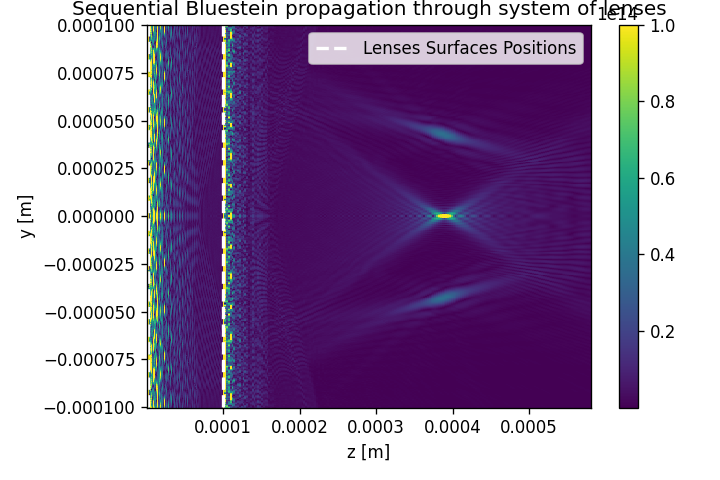

In [87]:
Exy_Bluestein_all =  np.abs(Exy_Bluestein_stack[:,int(y_pixel/2), :])
print(Exy_Bluestein_all.shape)

zall = np.hstack((Eyz1.z, Eyz2.z+np.max(Eyz1.z)) )
yall = Eyz1.y 

print(yall.shape, zall.shape)

fig = plt.figure(figsize=(6,4)) 
plt.pcolormesh(zall, yall, Exy_Bluestein_all, vmax=1e14)
plt.xlabel("z [m]")
plt.ylabel("y [m]")
plt.tight_layout()
plt.colorbar()

plt.vlines([zmin1+wavelength, zmin2+np.max(Eyz1.z)], -aperture_width/2, aperture_width/2, colors='white', linestyles='dashed', lw=2, \
           label="Lenses Surfaces Positions")
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("Sequential Bluestein propagation through system of lenses")
plt.legend()

plt.savefig("multilens_all_bluestein.png", dpi=600)



(400, 400)
(400,) (400,)


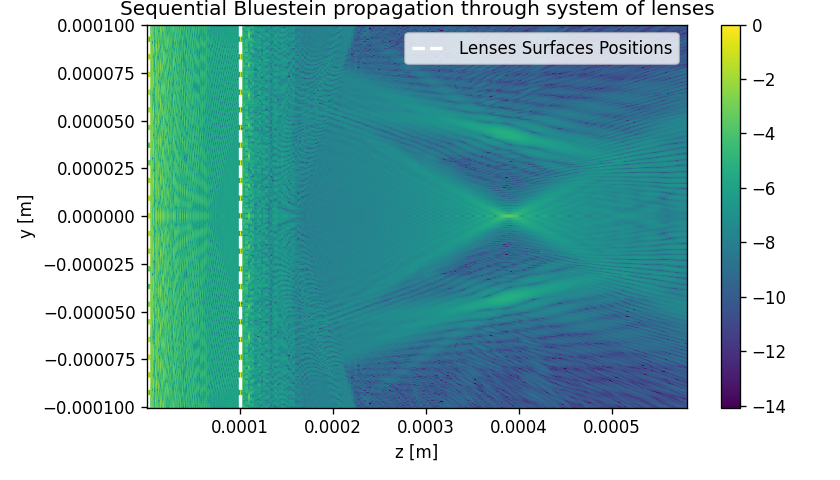

In [81]:
Exy_Bluestein_all = np.hstack((np.abs(EXYZ1.screen[:,int(y_pixel/2), :])/np.max(np.abs(EXYZ1.screen[:,int(y_pixel/2), :])),\
                               np.abs(EXYZ2.screen[:,int(y_pixel/2), :])/np.max(np.abs(EXYZ2.screen[:,int(y_pixel/2), :]))))
print(Exy_Bluestein_all.shape)

zall = np.hstack((Eyz1.z, Eyz2.z+np.max(Eyz1.z) ))
yall = Eyz1.y 

print(yall.shape, zall.shape)

fig = plt.figure(figsize=(7,4)) 
plt.pcolormesh(zall, yall, np.log(Exy_Bluestein_all) ) 
plt.xlabel("z [m]")
plt.ylabel("y [m]")
plt.tight_layout()

plt.vlines([zmin1+wavelength, zmin2+np.max(Eyz1.z)], -aperture_width/2, aperture_width/2, colors='white', linestyles='dashed', lw=2, \
           label="Lenses Surfaces Positions")
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("Sequential Bluestein propagation through system of lenses")
plt.legend()
plt.colorbar()

plt.savefig("multilens_all_bluestein-log.png", dpi=600)

In [88]:
##Propagate field in plane XY at z_distance using RS 

z_distance = zmax1

# Creates XY screen
screen_XY = moe.field.create_screen_XY(-aperture_width/2, aperture_width/2, x_pixel, 
                                       -aperture_height/2, aperture_height/2, y_pixel, 
                                        z=z_distance)

# Propagate the field
E_XY = moe.propagate.RS_integral(field1, screen_XY, wavelength, simp2d=True)

[########################################] | 100% Completed | 35m 53s


In [89]:
E_XY.screen[:,:,0].shape

(400, 400)

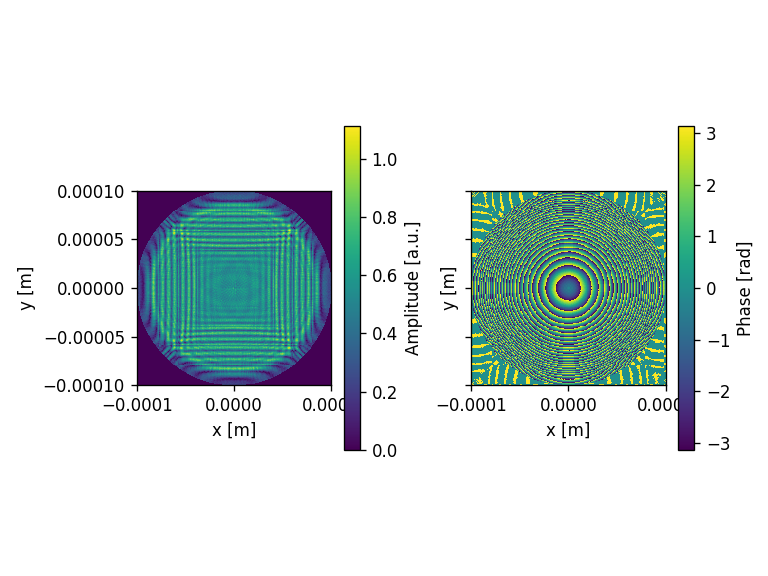

In [90]:
field2.field = E_XY.screen[:,:,0]/np.max(E_XY.screen[:,:,0])

# Modulates the field with a given aperture that can be used either as an amplitude mask or a phase mask
field2 = moe.field.modulate_field(field2, amplitude_mask = asph2_mask_inten, phase_mask=asph2_mask_phase)

# Plots the field (amplitude and phase)
moe.plotting.plot_field(field2)

plt.tight_layout()
plt.show()

In [91]:
# Propagate the field 
EXYZ22 = moe.propagate.Bluestein(field2, screen2, wavelength)

Elapsed: 0:00:28.374542


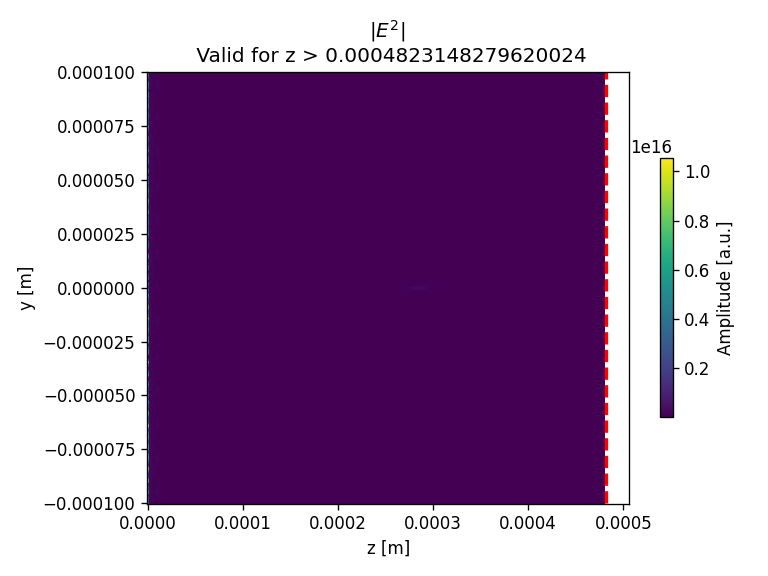

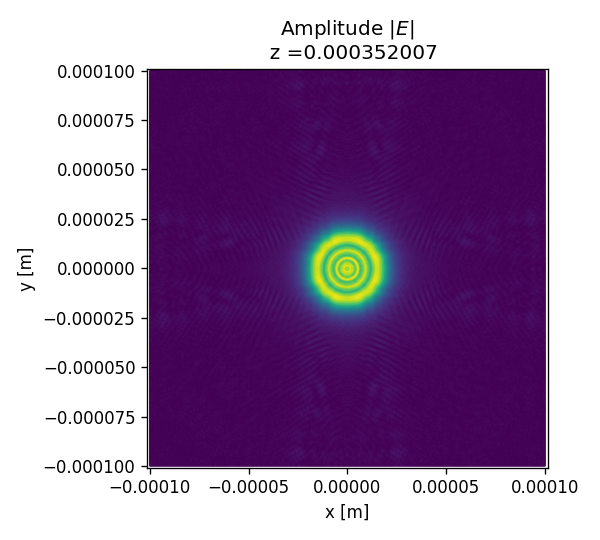

In [92]:
Eyz22 = moe.field.Screen(0,y2,z2)
Eyz22.screen = np.reshape(np.abs(EXYZ22.screen[:,int(y_pixel/2), :]), np.shape(Eyz2.screen[:, :, :]))

moe.plotting.plot_screen_YZ(Eyz22, which='amplitude')

limitx = moe.propagate.Fresnel_criterion(wavelength,aperture_width/2)
plt.vlines(limitx, -aperture_width/2, aperture_width/2, colors='red', linestyles='dashed', lw=2)
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("|$E^2$| \n Valid for z > "+str(limitx))
plt.tight_layout()
plt.show()


Exy2 = moe.field.Screen(x2,y2,0)

fig = plt.figure(figsize=(5,4.5)) 
plt.pcolormesh(x2,y2, np.abs(EXYZ22.screen[:,:,  int(dist2/zmax2*nzs)-20]), shading='gouraud')
plt.title("Amplitude |$E$|\n  z =" +str(dist2-20*(zmax2-zmin2)/nzs))

plt.xlabel("x [m]")
plt.ylabel("y [m]")
plt.tight_layout()
plt.axis('equal')
plt.tight_layout()
plt.show()

C:\Users\jcunha377\AppData\Local\Temp\6\ipykernel_88528\1509111804.py:9: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(zall, yall, Exy_RS_Bluestein, vmax=1e14)


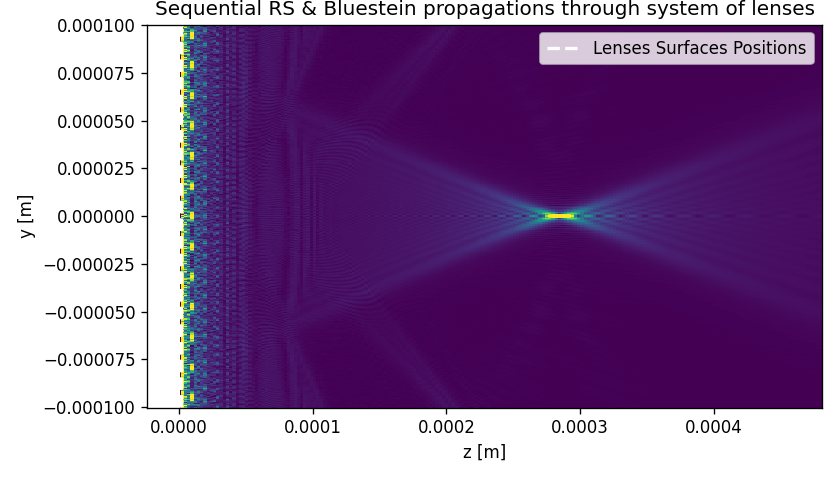

In [96]:
Exy_RS_Bluestein = np.hstack((np.zeros(np.shape(np.abs(EXYZ1.screen[:,int(y_pixel/2), :]))),\
                              np.abs(EXYZ22.screen[:,int(y_pixel/2), :])))

zall = np.hstack((Eyz1.z, Eyz2.z) )
yall = Eyz1.y 


fig = plt.figure(figsize=(7,4)) 
plt.pcolormesh(zall, yall, Exy_RS_Bluestein, vmax=1e14)
plt.xlabel("z [m]")
plt.ylabel("y [m]")
plt.tight_layout()

plt.vlines([zmin1+wavelength, zmin2], -aperture_width/2, aperture_width/2, colors='white', linestyles='dashed', \
           lw=2, label="Lenses Surfaces Positions")
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("Sequential RS & Bluestein propagations through system of lenses")
plt.legend()

plt.savefig("multilens_RS+Bluestein.png", dpi=600)

In [97]:
limitx = moe.propagate.Fresnel_criterion(wavelength,aperture_width/2)
limitx

0.0004823148279620024

C:\Users\jcunha377\AppData\Local\Temp\6\ipykernel_88528\1689431338.py:9: RuntimeWarning: divide by zero encountered in log
  plt.pcolormesh(zall, yall, np.log(Exy_RS_Bluestein) )
C:\Users\jcunha377\AppData\Local\Temp\6\ipykernel_88528\1689431338.py:9: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  plt.pcolormesh(zall, yall, np.log(Exy_RS_Bluestein) )


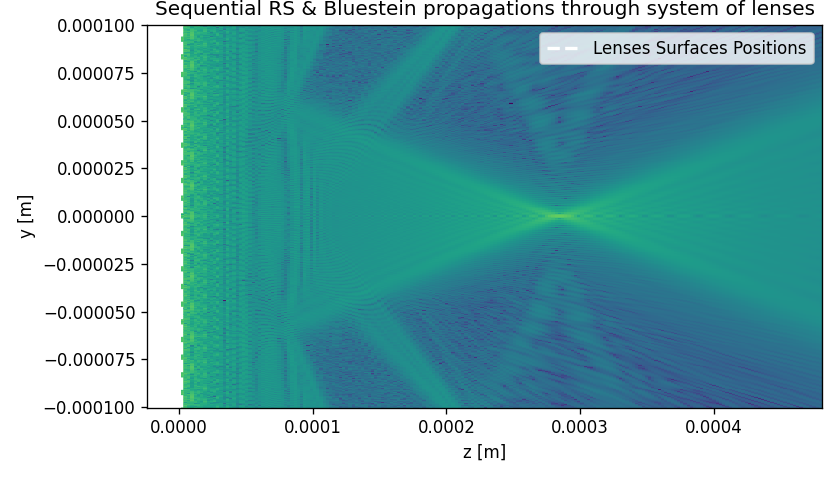

In [98]:
Exy_RS_Bluestein = np.hstack((np.zeros(np.shape(np.abs(EXYZ1.screen[:,int(y_pixel/2), :]))),\
                              np.abs(EXYZ22.screen[:,int(y_pixel/2), :])))

zall = np.hstack((Eyz1.z, Eyz2.z) )
yall = Eyz1.y 


fig = plt.figure(figsize=(7,4)) 
plt.pcolormesh(zall, yall, np.log(Exy_RS_Bluestein) )
plt.xlabel("z [m]")
plt.ylabel("y [m]")
plt.tight_layout()

plt.vlines([zmin1+wavelength, zmin2], -aperture_width/2, aperture_width/2, colors='white', linestyles='dashed', \
           lw=2, label="Lenses Surfaces Positions")
#plt.annotate("Fresnel distance", (limitx-limitx*0.1,-0.002), rotation="vertical", color="Red")

plt.title("Sequential RS & Bluestein propagations through system of lenses")
plt.legend()

plt.savefig("multilens_RS+Bluestein-log.png", dpi=600)